In [1]:
import pandas as pd # type: ignore
import torch # type: ignore
from torch.utils.data import Dataset, DataLoader # type: ignore
import torch.nn as nn # type: ignore
import torch.optim as optim # type: ignore
import matplotlib.pyplot as plt # type: ignore
import os
from astropy.io import ascii # type: ignore
import numpy as np
import pywt # type: ignore
import torch.nn.functional as F

In [2]:
def readKMT(filepath, target_rows=5000, threshold=0.1):
    # Read the data
    data = pd.read_csv("../" + filepath, sep='\s+', header=0)
    
    # Ensure the columns are numeric
    data = data.apply(pd.to_numeric, errors='coerce')
    
    # Drop rows with NaN values
    data = data.dropna(subset=[data.columns[0], data.columns[3]])  

    # Calculate the differences between consecutive HJD values
    data['x_diff'] = data[data.columns[0]].diff().abs()

    # Detect gaps larger than the threshold
    gap_indices = data[data['x_diff'] > threshold].index

    # Split the data into segments based on the detected gaps
    split_dataframes = np.array_split(data, gap_indices)

    total_rows = sum(df.shape[0] for df in split_dataframes)

    padded_dataframes = []

    if total_rows < target_rows:
        loop_count = 0

        while total_rows < target_rows:
            loop_count += 1
            for df in split_dataframes:
                # Generate small random noise to avoid line shapes
                noise = np.random.normal(0, 1e-8, size=(df.shape[0], 2))
                
                # Create new similar data points
                new_values = df[[data.columns[0], data.columns[3]]].values + noise
                new_df = pd.DataFrame(new_values, columns=[data.columns[0], data.columns[3]])

                padded_dataframes.append(df[[data.columns[0], data.columns[3]]])
                padded_dataframes.append(new_df)

                total_rows += new_df.shape[0]

                # Stop if the total number of rows reaches or exceeds the target
                if total_rows >= target_rows:
                    break

        # Concatenate all dataframes and truncate to the target size
        combined_dataframe = pd.concat(padded_dataframes, ignore_index=True)
        combined_dataframe = combined_dataframe.iloc[:target_rows]
    else:
        combined_dataframe = pd.concat(split_dataframes, ignore_index=True)
        combined_dataframe = combined_dataframe.iloc[:target_rows]


    data_tensor = torch.tensor(combined_dataframe[[data.columns[0], data.columns[3]]].values, dtype=torch.float32)
    return data_tensor

def readKMT2(filepath, target_rows=6428, threshold=0.1):
        data = pd.read_csv("../" + filepath, sep='\s+', header=None)
        data = data.apply(pd.to_numeric, errors='coerce')
        data = data.dropna(subset=[data.columns[0], data.columns[3]])
        data['x_diff'] = data[data.columns[0]].diff().abs()
        gap_indices = data[data['x_diff'] > threshold].index
        split_dataframes = np.array_split(data, gap_indices)
        total_rows = sum(df.shape[0] for df in split_dataframes)
        padded_dataframes = []

        if total_rows < target_rows:
            loop_count = 0
            while total_rows < target_rows:
                loop_count += 1
                for df in split_dataframes:
                    noise = np.random.normal(0, 1e-8, size=(df.shape[0], 2))
                    new_values = df[[data.columns[0], data.columns[3]]].values + noise
                    new_df = pd.DataFrame(new_values, columns=[data.columns[0], data.columns[3]])
                    padded_dataframes.append(df[[data.columns[0], data.columns[3]]])
                    padded_dataframes.append(new_df)
                    total_rows += new_df.shape[0]
                    if total_rows >= target_rows:
                        break
            combined_dataframe = pd.concat(padded_dataframes, ignore_index=True)
            combined_dataframe = combined_dataframe.iloc[:target_rows]
        else:
            combined_dataframe = pd.concat(split_dataframes, ignore_index=True)
            combined_dataframe = combined_dataframe.iloc[:target_rows]

        magnitudes = combined_dataframe[data.columns[3]].values
        for i in range(1, len(magnitudes) - 1):
            if abs(magnitudes[i] - magnitudes[i-1]) > 0.3 and abs(magnitudes[i] - magnitudes[i+1]) > 0.3:
                avg_neighbor_magnitude = (magnitudes[i-1] + magnitudes[i+1]) / 2
                if magnitudes[i] > avg_neighbor_magnitude:
                    magnitudes[i] = avg_neighbor_magnitude + 0.1
                else:
                    magnitudes[i] = avg_neighbor_magnitude - 0.1
        combined_dataframe[data.columns[3]] = magnitudes

        data_tensor = torch.tensor(combined_dataframe[[data.columns[0], data.columns[3]]].values, dtype=torch.float32)
        return data_tensor
 

def readOGLE(filepath, threshold, target_rows=6428):
    data = pd.read_csv("../" + filepath, sep='\s+', header=None)

    # Calculate gaps and split data based on threshold
    data['x_diff'] = data[0].diff().abs()
    gap_indices = data[data['x_diff'] > threshold].index
    dfs = np.array_split(data, gap_indices)
    
    # Filter out small groups and remove outliers near (0,0)
    dfs = [df[(df[0] > 1e-6) & (df[1] > 1e-6)] for df in dfs if len(df) > 0]
    
    if not dfs:
        raise ValueError("No valid groups found.")
    
    # Find the group with the lowest average magnitude
    min_avg_value = float('inf')
    min_avg_group_df = None
    
    for group in dfs:
        avg = group[1].mean()
        if avg < min_avg_value:
            min_avg_value = avg
            min_avg_group_df = group
    
    selected_df = min_avg_group_df
    
    # Convert to tensor
    data_tensor = torch.tensor(selected_df[[0, 1]].values, dtype=torch.float32)
    num_rows = data_tensor.shape[0]
    
    # Function to downsample tensor
    def downsample_tensor(data_tensor, target_length):
        current_length = data_tensor.shape[0]
        
        # If current length is already less than or equal to the target length, return as is
        if current_length <= target_length:
            return data_tensor
        
        # Calculate indices to remove
        indices_to_remove = np.linspace(0, current_length - 1, current_length - target_length, dtype=int)
        
        # Create a mask to keep only the required indices
        mask = np.ones(current_length, dtype=bool)
        mask[indices_to_remove] = False
        
        # Apply the mask to get the downsampled tensor
        downsampled_tensor = data_tensor[mask]
        
        return downsampled_tensor

    # Function to augment tensor with small noise to reach the target length
    def augment_tensor(data_tensor, target_length):
        current_length = data_tensor.shape[0]
        
        # If current length is already equal to or exceeds the target length, return as is
        if current_length >= target_length:
            return data_tensor[:target_length]
        
        # Generate small random noise to avoid line shapes
        while current_length < target_length:
            noise = torch.normal(0, 1e-8, size=data_tensor.shape)
            new_data = data_tensor + noise
            data_tensor = torch.cat((data_tensor, new_data), dim=0)
            current_length = data_tensor.shape[0]
            
            if current_length >= target_length:
                break
        
        return data_tensor[:target_length]
    
    # Downsample or augment the tensor to reach the target length
    if num_rows > target_rows:
        data_tensor = downsample_tensor(data_tensor, target_rows)
    else:
        data_tensor = augment_tensor(data_tensor, target_rows)
    
    return data_tensor

def read_and_process_WFIRST(filepath, threshold, target_length=6428):
    # Read the data
    data = pd.read_csv(filepath, sep='\s+', header=None)
    data.columns = ['HJD', 'mag', 'mag_err']
    
    # Compute the differences
    data['x_diff'] = data['HJD'].diff().abs()
    
    # Identify gap indices
    gap_indices = data[data['x_diff'] > threshold].index
    
    # Split the data into groups based on the gap indices
    dfs = np.array_split(data, gap_indices)
    
    # Filter out groups with fewer than 100 data points
    dfs = [group for group in dfs if len(group) >= 100]
    
    if not dfs:
        raise ValueError("No group with 100 or more data points found.")
    
    # Find the group with the lowest average magnitude
    min_avg_index = None
    min_avg_value = float('inf')
    
    for i, group in enumerate(dfs):
        avg = group['mag'].mean()
        if avg < min_avg_value:
            min_avg_value = avg
            min_avg_index = i
    
    # Select the group with the lowest average magnitude
    smallest_avg_df = dfs[min_avg_index]
    
    # Remove outliers near (0,0)
    smallest_avg_df = smallest_avg_df[(smallest_avg_df['HJD'] > 1e-6) & (smallest_avg_df['mag'] > 1e-6)]
    
    # Convert the selected group to a tensor
    data_tensor = torch.tensor(smallest_avg_df[['HJD', 'mag']].values, dtype=torch.float32)
    TensorLength = len(data_tensor)
    
    # Function to downsample the tensor
    def downsample_tensor(data_tensor, target_length):
        current_length = data_tensor.shape[0]
        
        # If current length is already less than or equal to the target length, return as is
        if current_length <= target_length:
            return data_tensor
        
        # Calculate indices to remove
        indices_to_remove = np.linspace(0, current_length - 1, current_length - target_length, dtype=int)
        
        # Create a mask to keep only the required indices
        mask = np.ones(current_length, dtype=bool)
        mask[indices_to_remove] = False
        
        # Apply the mask to get the downsampled tensor
        downsampled_tensor = data_tensor[mask]
        
        return downsampled_tensor
    
    # Function to augment the tensor with small noise to reach the target length
    def augment_tensor(data_tensor, target_length):
        current_length = data_tensor.shape[0]
        
        # If current length is already equal to or exceeds the target length, return as is
        if current_length >= target_length:
            return data_tensor[:target_length]
        
        # Generate small random noise to avoid line shapes
        while current_length < target_length:
            noise = torch.normal(0, 1e-8, size=(data_tensor.shape))
            new_data = data_tensor + noise
            data_tensor = torch.cat((data_tensor, new_data), dim=0)
            current_length = data_tensor.shape[0]
            
            # Stop if the total number of rows reaches or exceeds the target
            if current_length >= target_length:
                break
        
        return data_tensor[:target_length]
    
    # Downsample or augment the tensor to reach the target length
    if TensorLength > target_length:
        data_tensor = downsample_tensor(data_tensor, target_length)
    else:
        data_tensor = augment_tensor(data_tensor, target_length)
    
    return data_tensor


def read_and_process_ROMAN(data, threshold, target_length=6428):
    data_csv = pd.read_csv(data, header=None, sep='\s+')

    data_csv['x_diff'] = data_csv[0].diff().abs()
    gap_indices = data_csv[data_csv['x_diff'] > threshold].index
    
    dfs = np.array_split(data_csv, gap_indices)
    
    # Ensure there are at least two groups
    if len(dfs) < 2:
        raise ValueError("Not enough groups found to select the second group.")
    
    # Select the second group
    second_group_df = dfs[1]
    
    # Remove outliers near (0,0)
    second_group_df = second_group_df[(second_group_df[0] > 1e-6) & (second_group_df[1] > 1e-6)]
    
    # Convert to tensor
    data_tensor = torch.tensor(second_group_df[[0, 1]].values, dtype=torch.float32)
    TensorLength = len(data_tensor)
    
    # Function to downsample tensor
    def downsample_tensor(data_tensor, target_length):
        current_length = data_tensor.shape[0]
        
        # If current length is already less than or equal to the target length, return as is
        if current_length <= target_length:
            return data_tensor
        
        # Calculate indices to remove
        indices_to_remove = np.linspace(0, current_length - 1, current_length - target_length, dtype=int)
        
        # Create a mask to keep only the required indices
        mask = np.ones(current_length, dtype=bool)
        mask[indices_to_remove] = False
        
        # Apply the mask to get the downsampled tensor
        downsampled_tensor = data_tensor[mask]
        
        return downsampled_tensor
    
    # Downsample or augment the tensor to reach the target length
    if TensorLength > target_length:
        data_tensor = downsample_tensor(data_tensor, target_length)
    else:
        # Function to augment tensor with small noise to reach the target length
        def augment_tensor(data_tensor, target_length):
            current_length = data_tensor.shape[0]
            
            # If current length is already equal to or exceeds the target length, return as is
            if current_length >= target_length:
                return data_tensor[:target_length]
            
            # Generate small random noise to avoid line shapes
            while current_length < target_length:
                noise = torch.normal(0, 1e-8, size=(data_tensor.shape))
                new_data = data_tensor + noise
                data_tensor = torch.cat((data_tensor, new_data), dim=0)
                current_length = data_tensor.shape[0]
                
                # Stop if the total number of rows reaches or exceeds the target
                if current_length >= target_length:
                    break
            
            return data_tensor[:target_length]
        
        data_tensor = augment_tensor(data_tensor, target_length)
    
    return data_tensor





def plot_tensor(tensor, x_label='HJD', y_label='mag'):
    x = tensor[:, 0].numpy()
    y = tensor[:, 1].numpy()
    
    plt.figure(figsize=(10, 6))
    plt.plot(x, y, 'b.')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(f'{x_label} vs {y_label}')
    plt.grid(True)
    plt.show()



<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:58: SyntaxWarning: invalid escape sequence '\s'
<>:101: SyntaxWarning: invalid escape sequence '\s'
<>:180: SyntaxWarning: invalid escape sequence '\s'
<>:269: SyntaxWarning: invalid escape sequence '\s'
<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:58: SyntaxWarning: invalid escape sequence '\s'
<>:101: SyntaxWarning: invalid escape sequence '\s'
<>:180: SyntaxWarning: invalid escape sequence '\s'
<>:269: SyntaxWarning: invalid escape sequence '\s'
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/1808782020.py:3: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=0)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/1808782020.py:58: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/1808782020.py:101: SyntaxWarning: invalid esc

/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4146044711.py:7: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  temp = pd.read_csv(file_path, delim_whitespace=True, header=None)


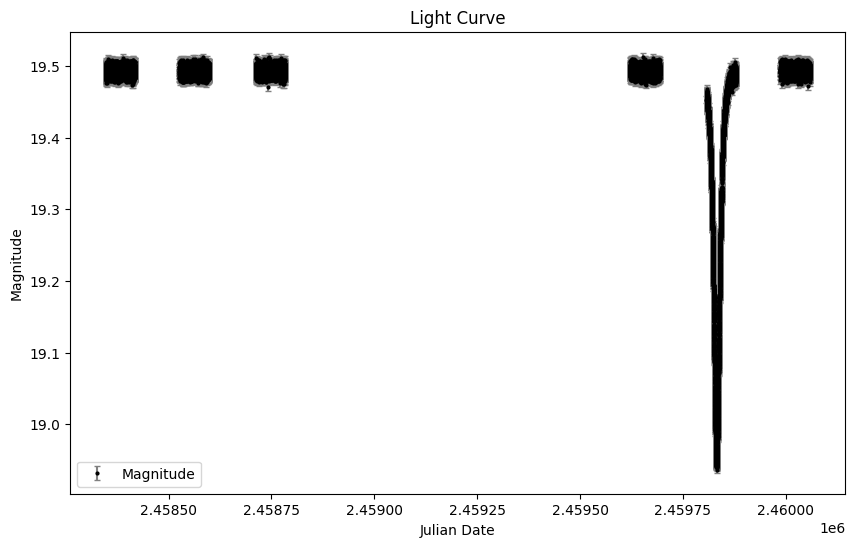

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


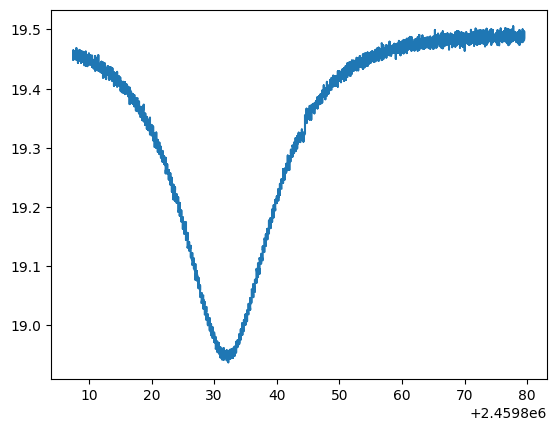

In [3]:
from astropy.timeseries import TimeSeries
from astropy.time import Time

file_path = '../Exodata/WFIRST/ulwdc1_214_W149.txt'
threshold = 1

temp = pd.read_csv(file_path, delim_whitespace=True, header=None)
time = Time(temp[0], format='jd')

# Create a TimeSeries object from the data
time_series = TimeSeries(time=time, data={'magnitude': temp[1], 'error': temp[2]})

# Plot the light curve
plt.figure(figsize=(10, 6))
plt.errorbar(time_series.time.jd, time_series['magnitude'], yerr=time_series['error'], fmt='o', ecolor='gray', capsize=2, markersize=2, color='black', label='Magnitude')
# plt.gca().invert_yaxis()  # Magnitude is inversely related to brightness
plt.xlabel('Julian Date')
plt.ylabel('Magnitude')
plt.title('Light Curve')
plt.legend()
plt.show()


data_group = read_and_process_WFIRST(file_path, threshold)
plt.plot(data_group[:,0], data_group[:,1])





/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/2732304581.py:10: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(file_path, delim_whitespace=True, header=None)
/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


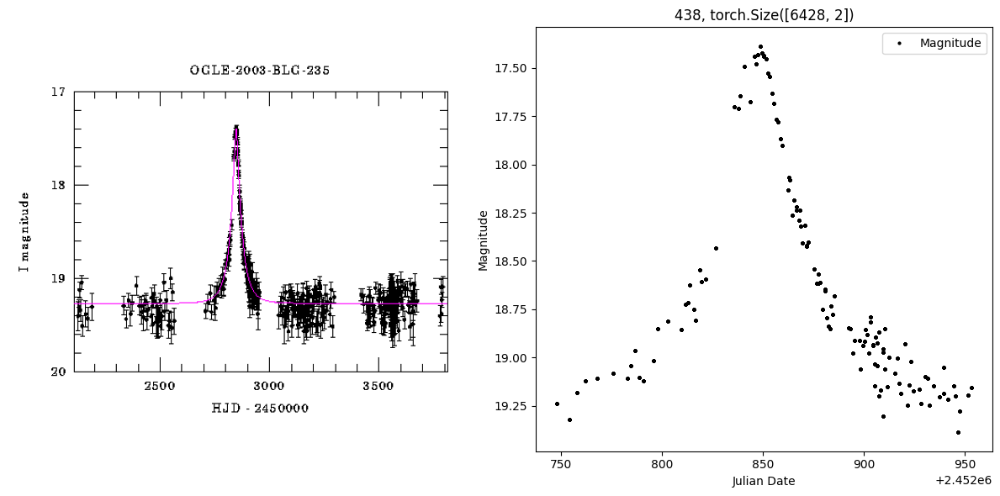

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


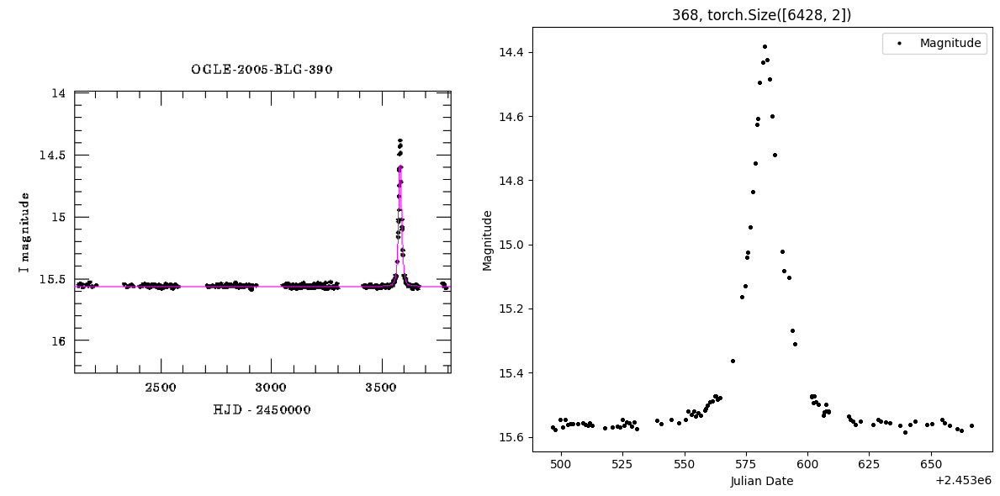

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


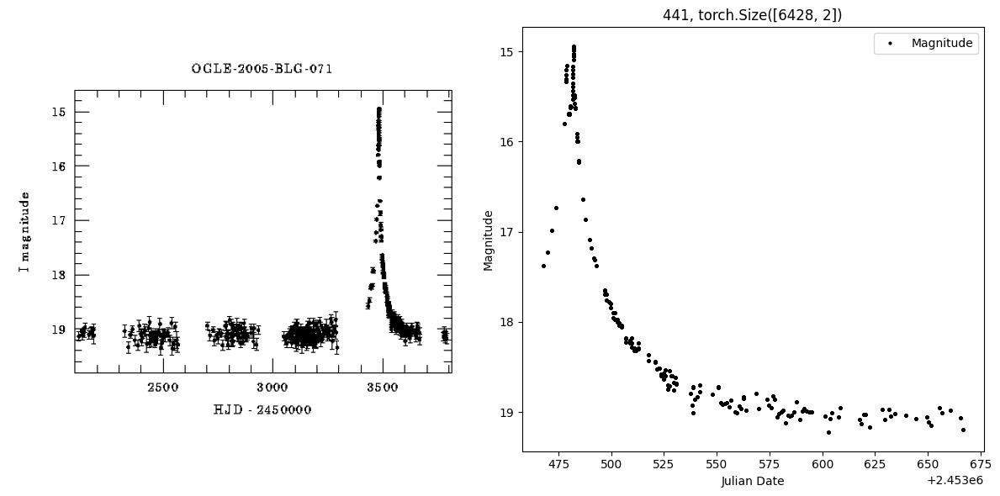

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


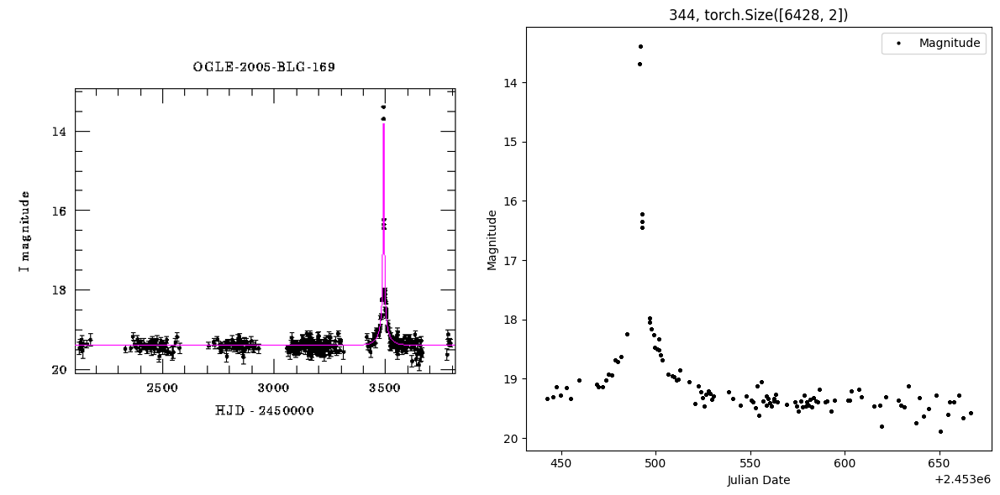

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


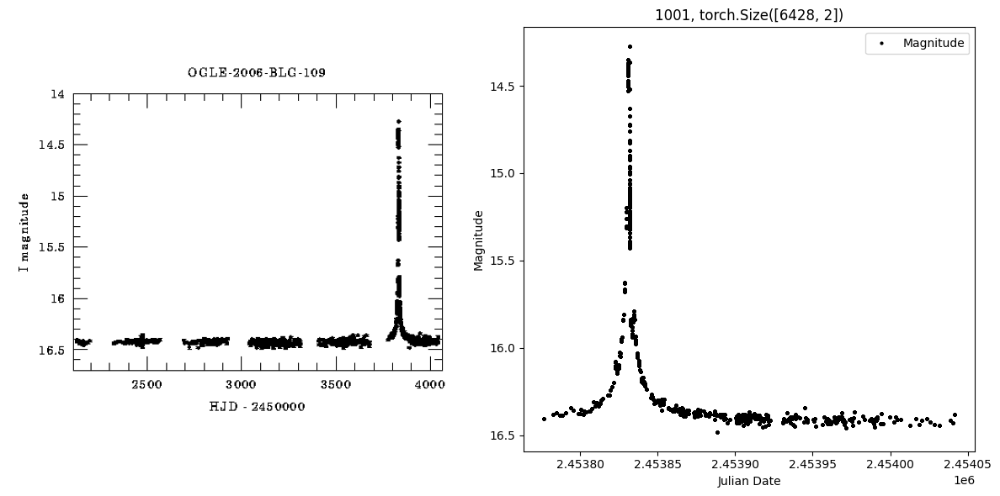

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


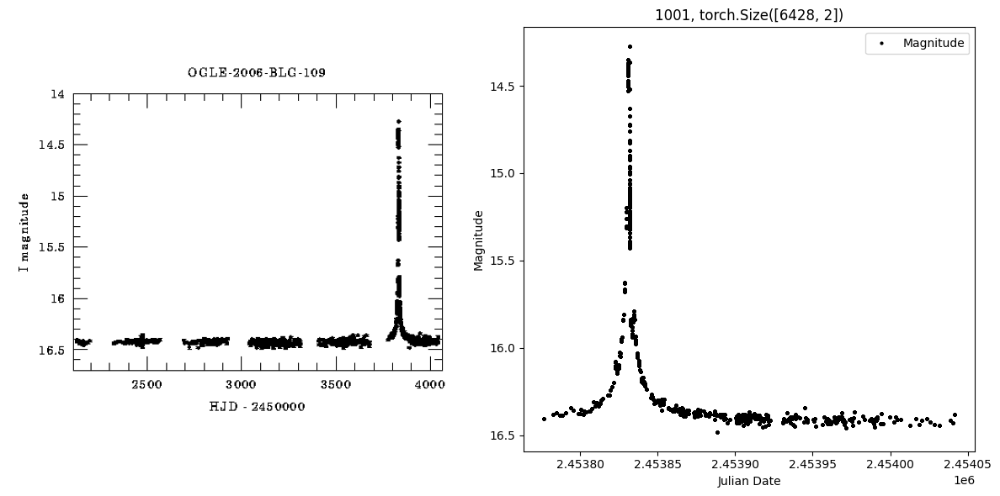

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


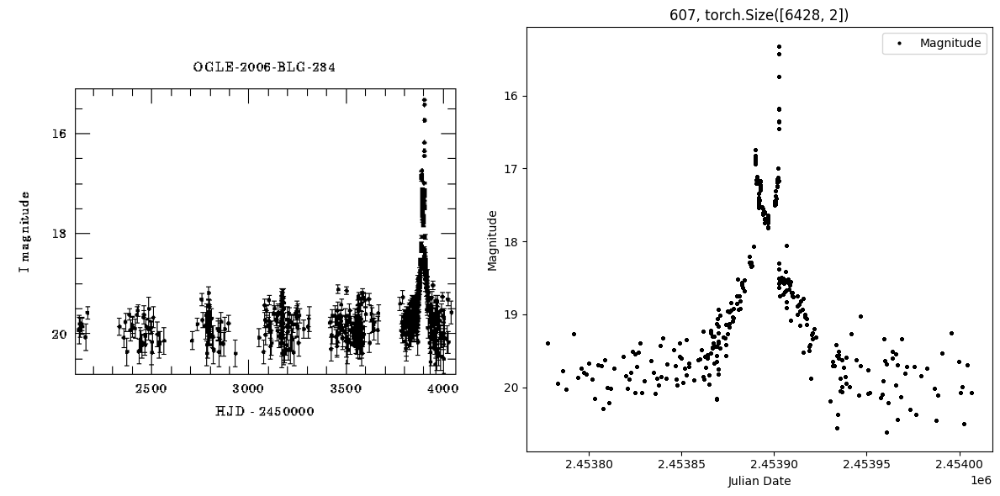

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


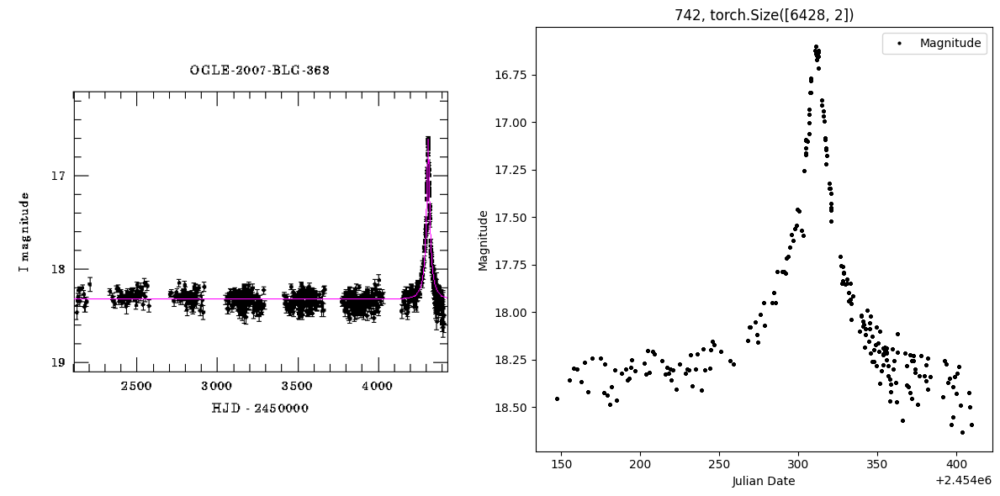

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


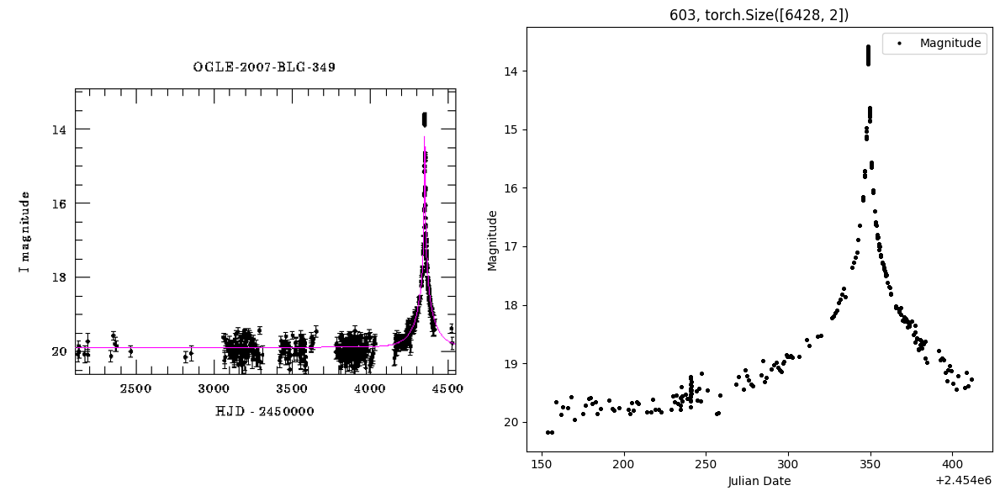

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


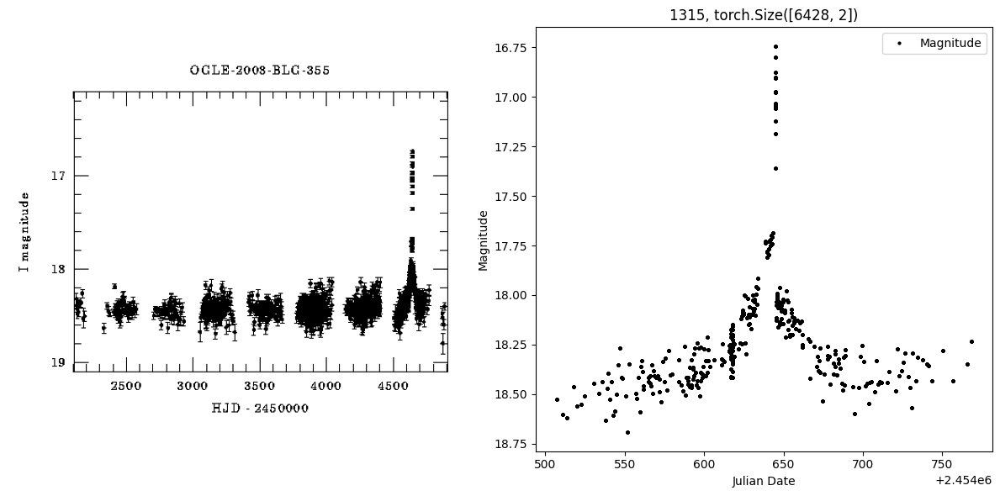

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


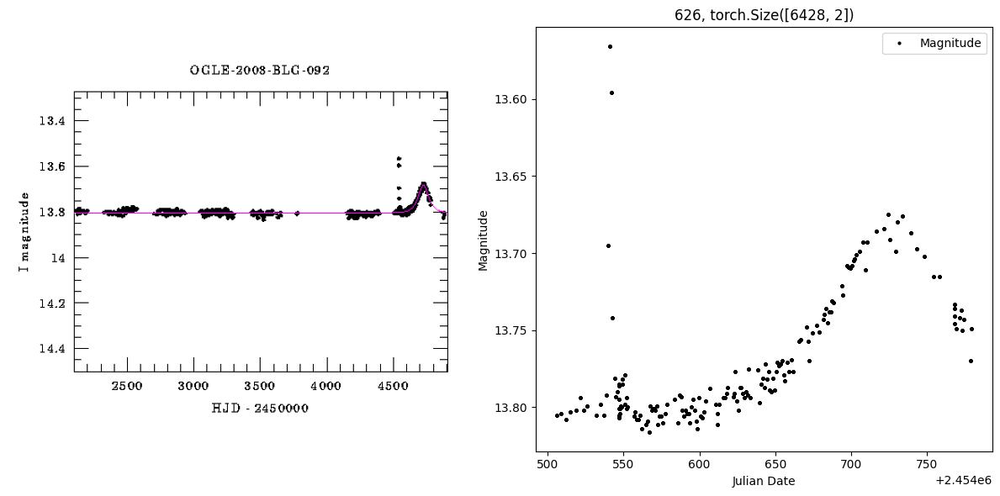

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


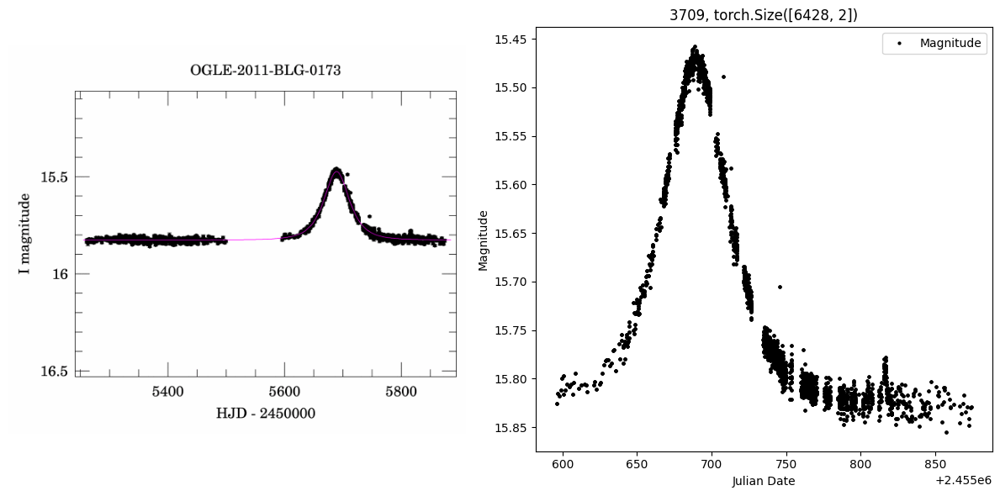

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


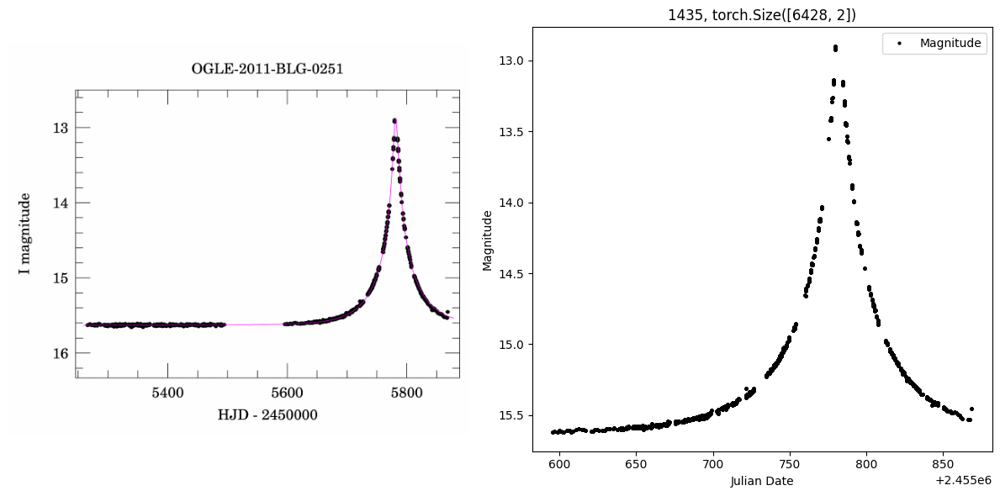

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


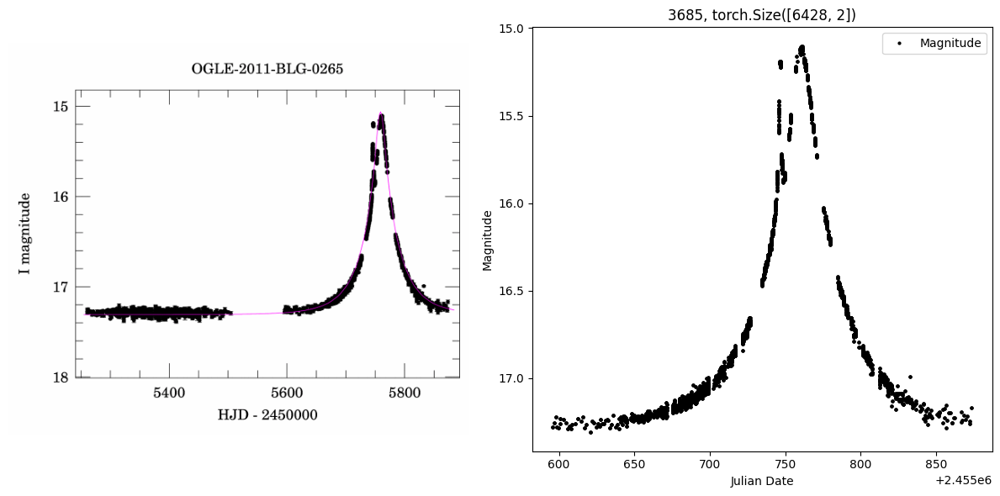

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


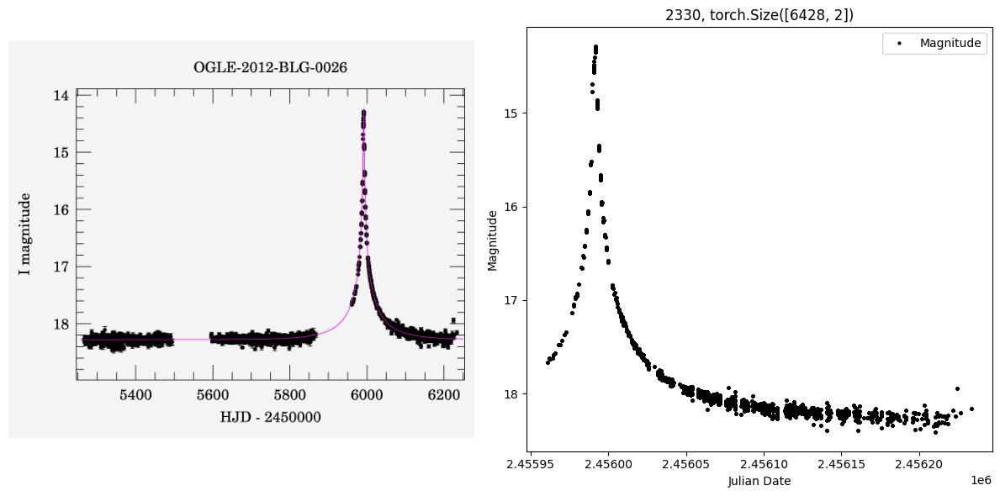

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


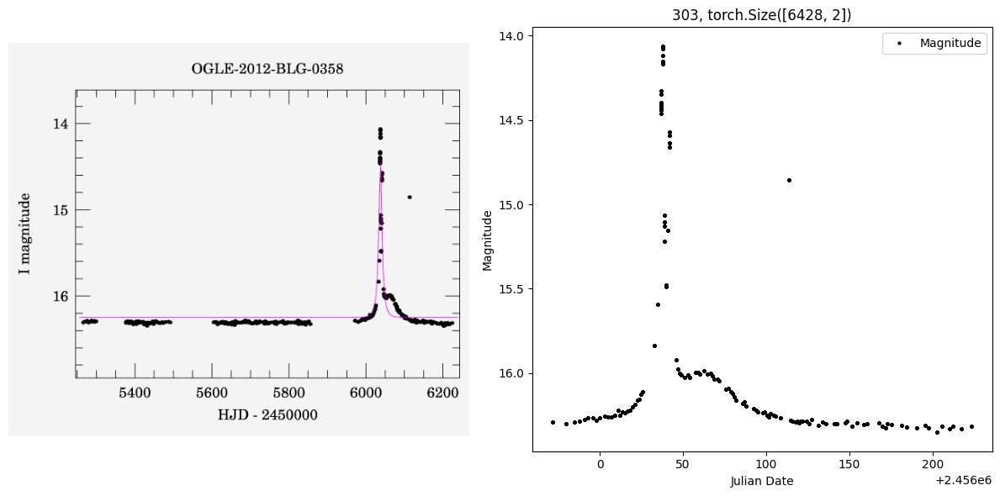

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


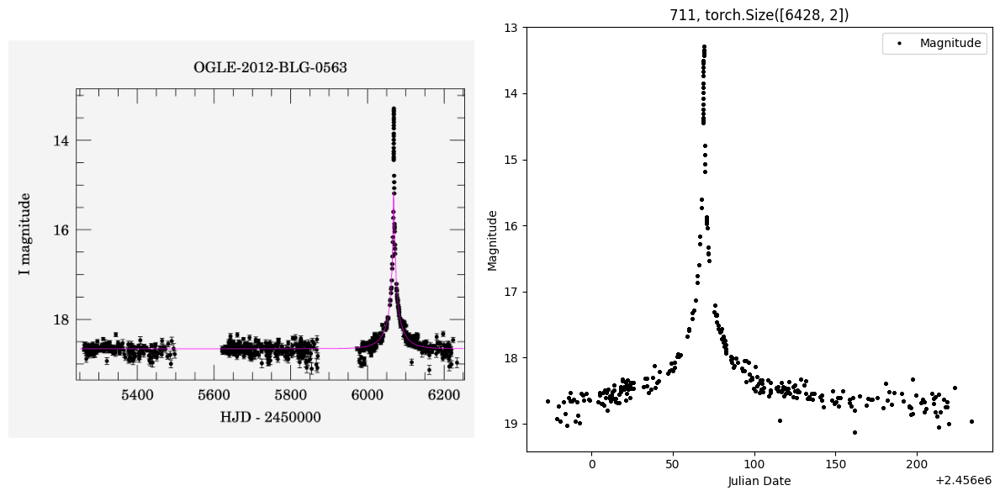

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


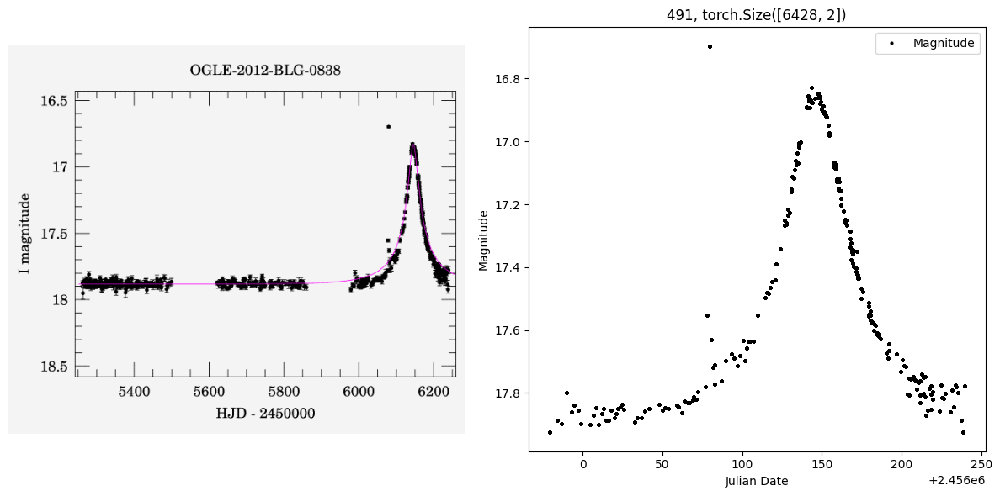

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


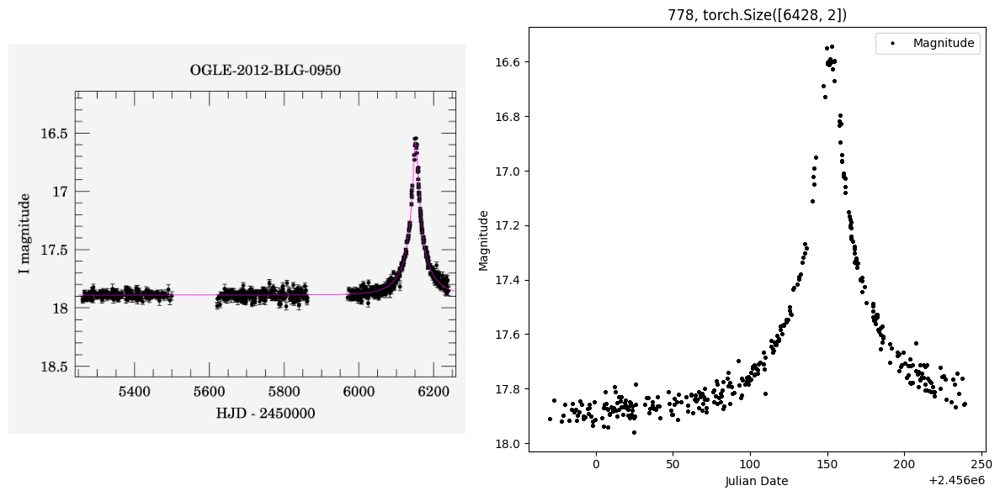

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


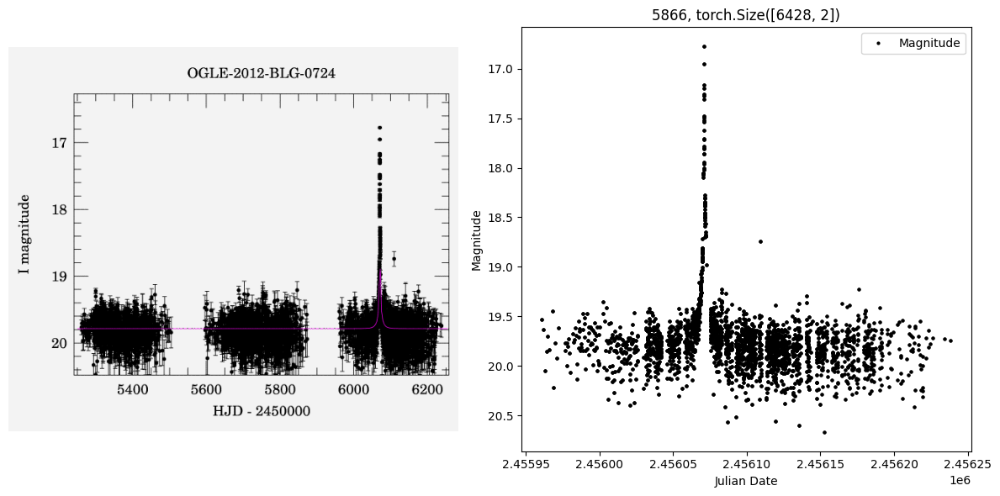

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


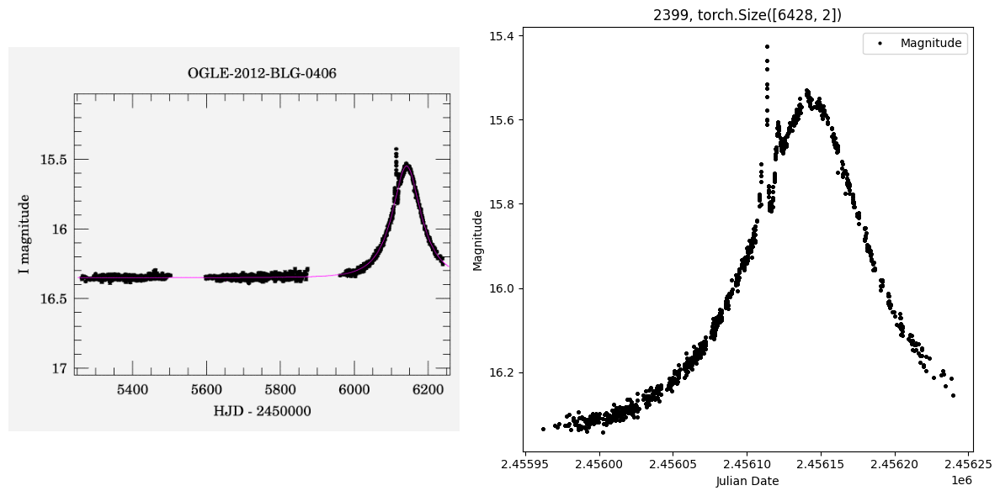

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


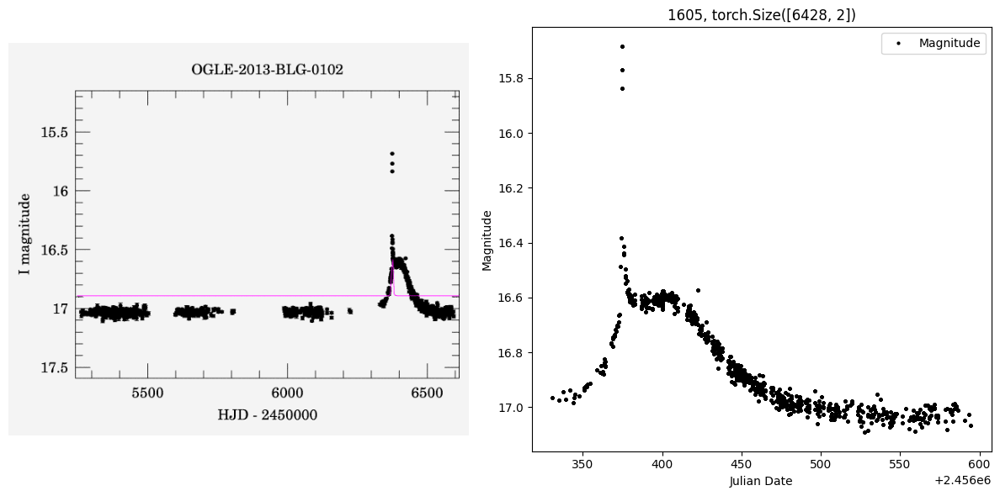

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


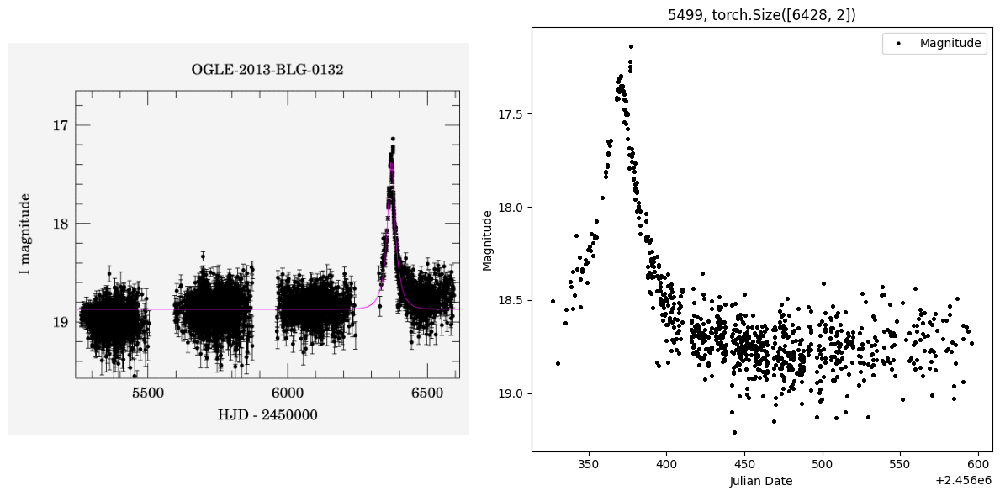

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


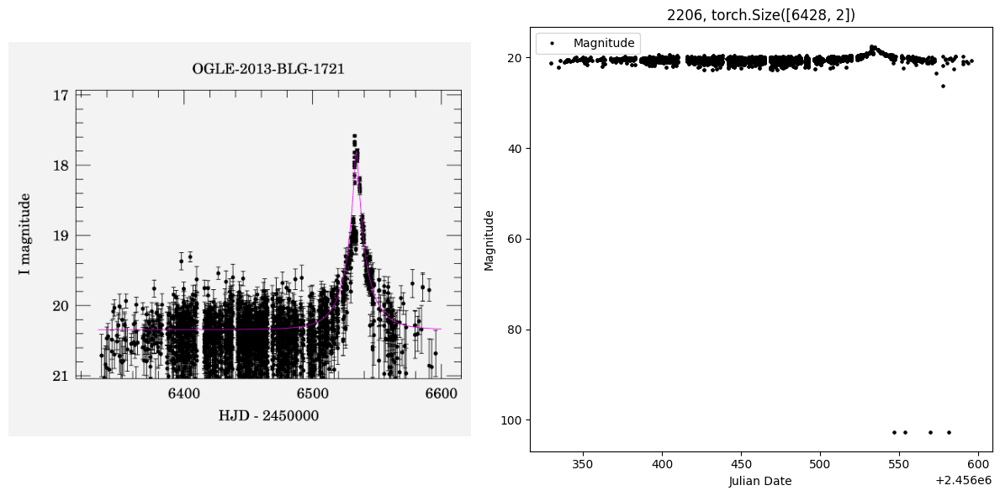

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


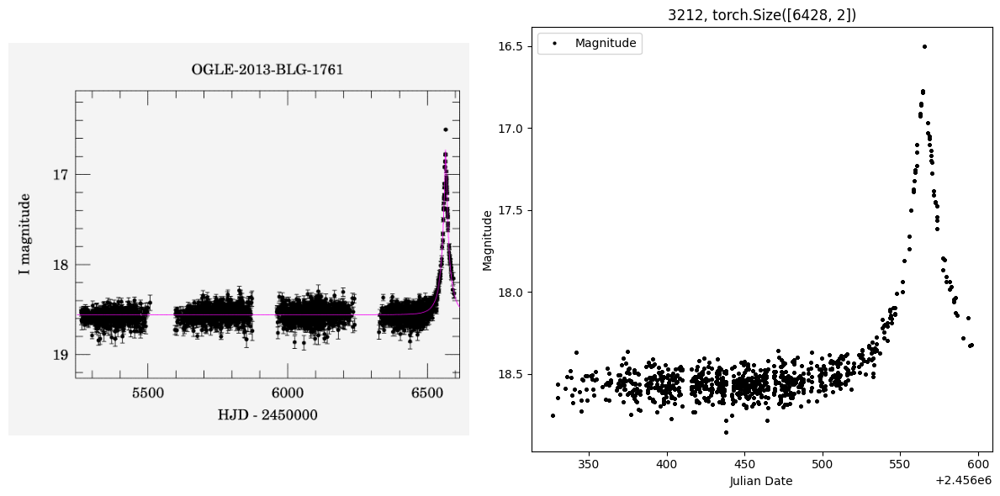

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


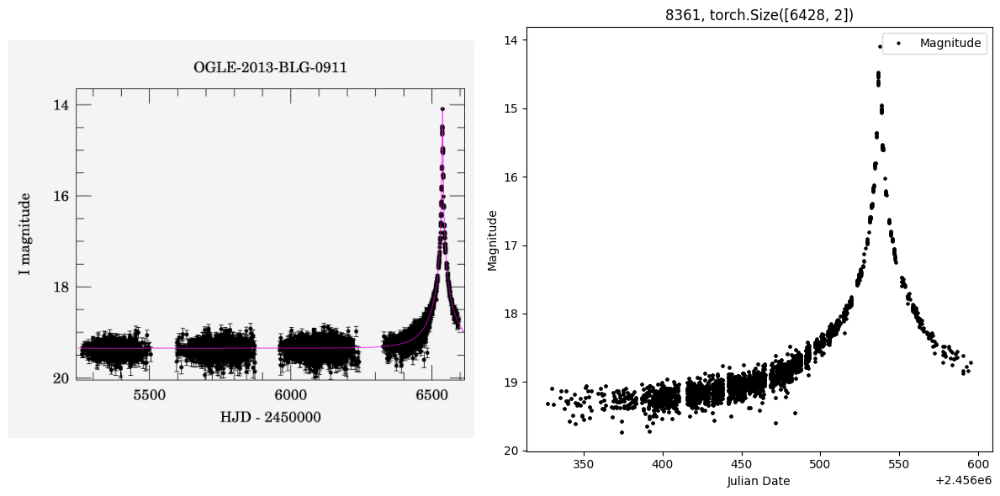

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


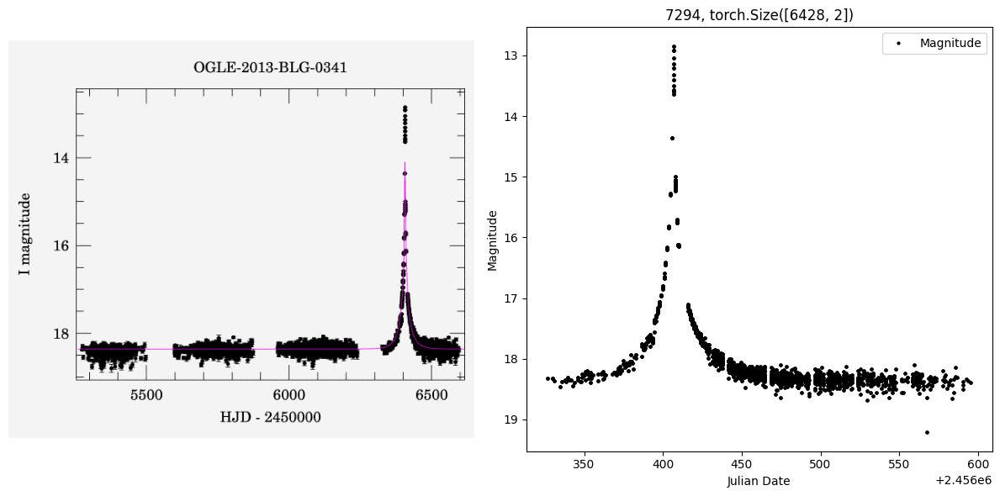

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


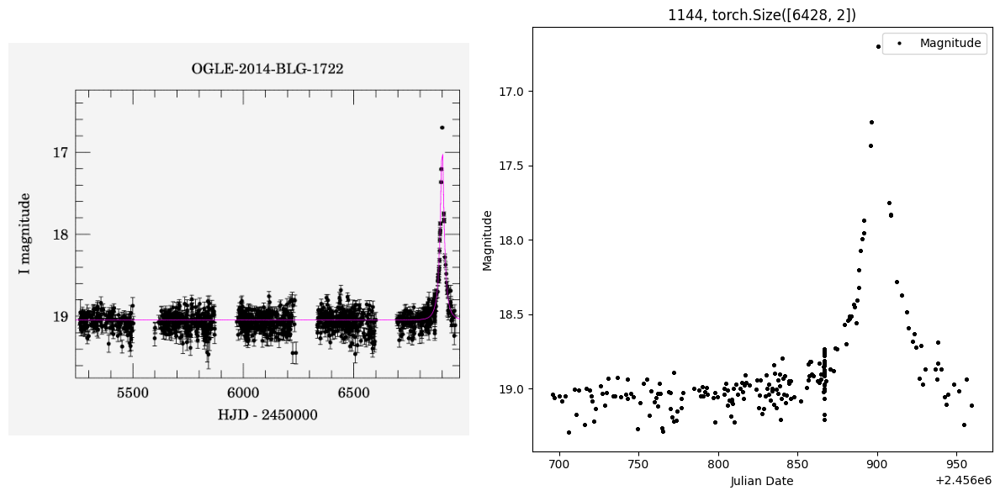

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


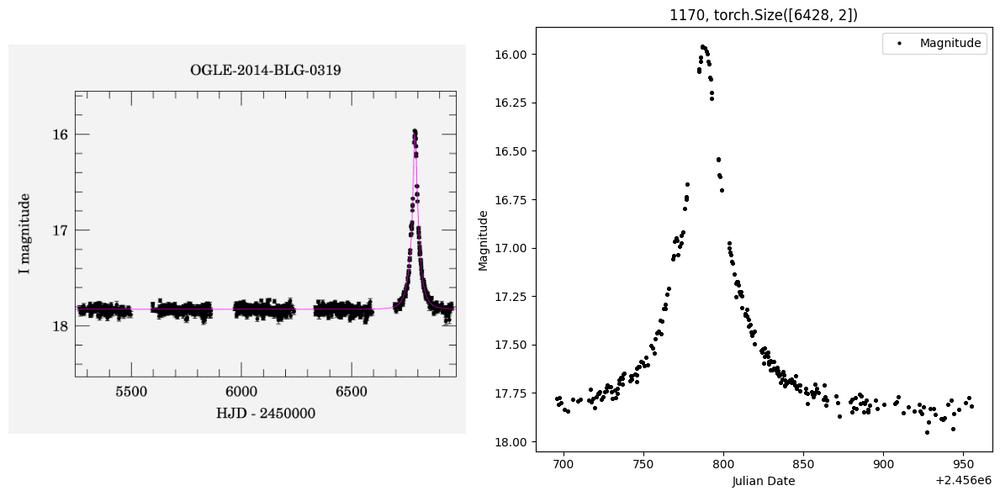

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


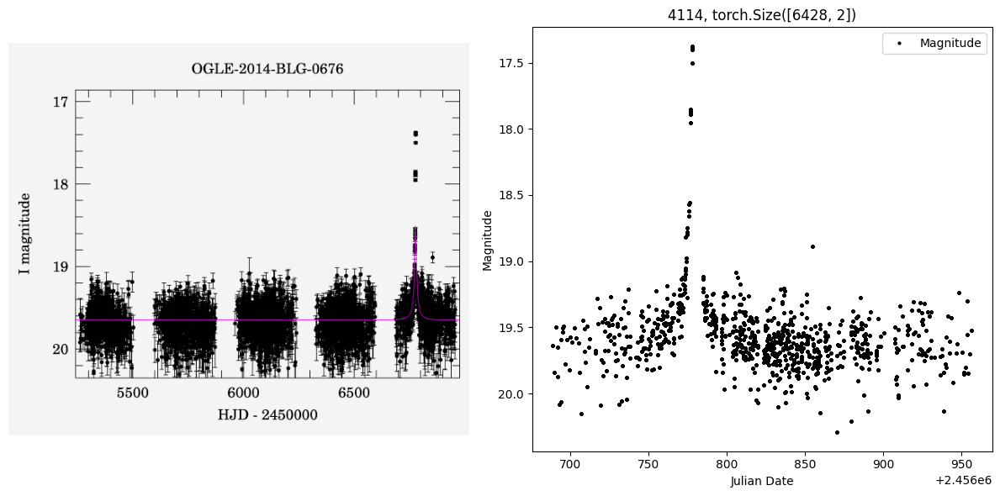

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


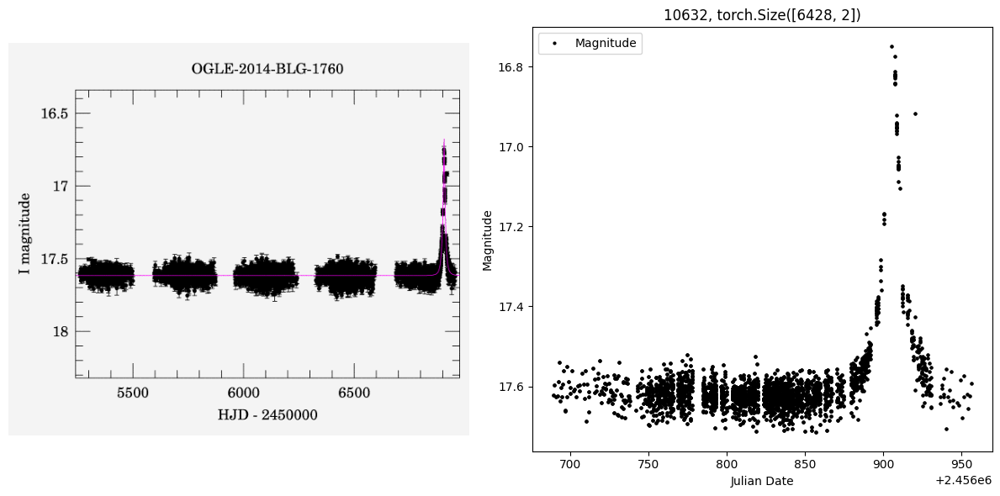

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


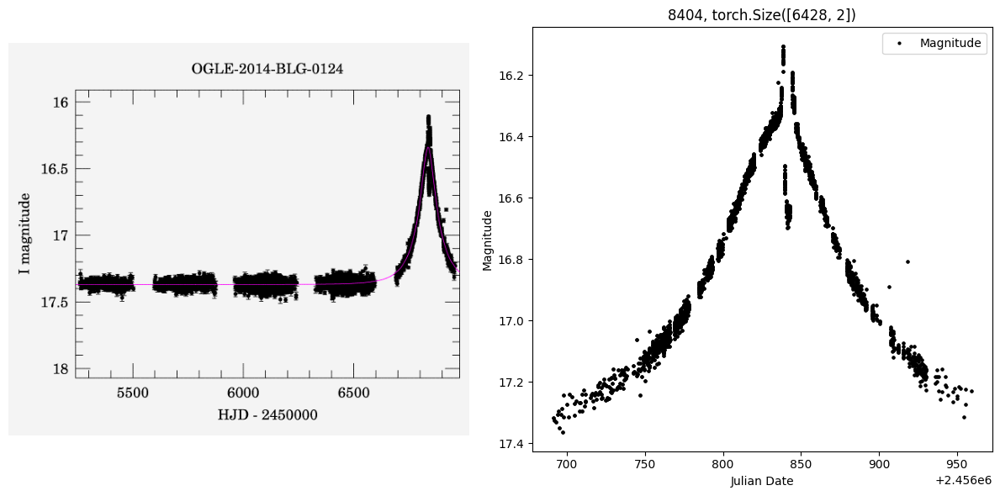

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


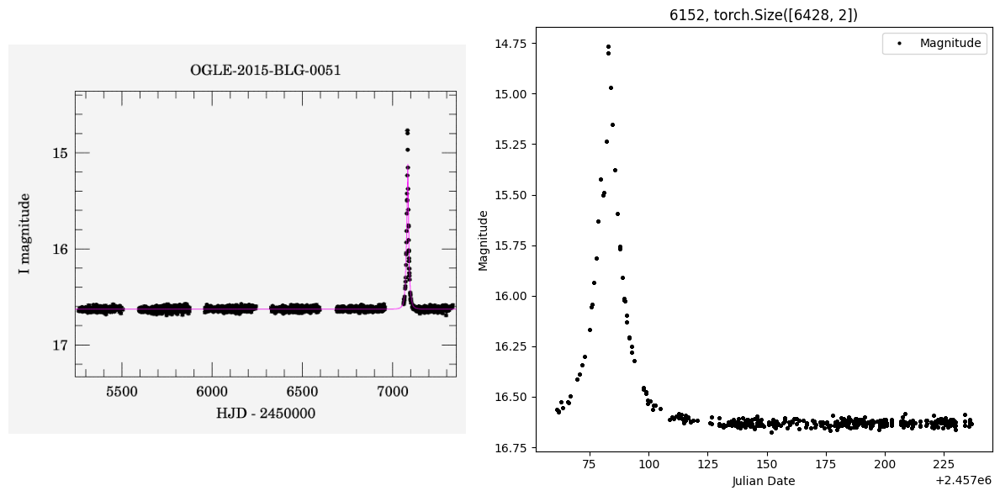

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


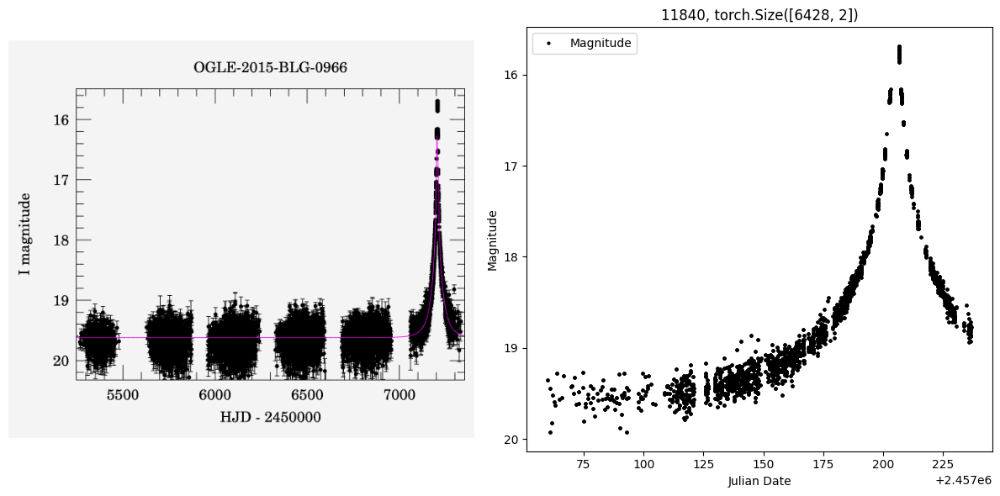

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


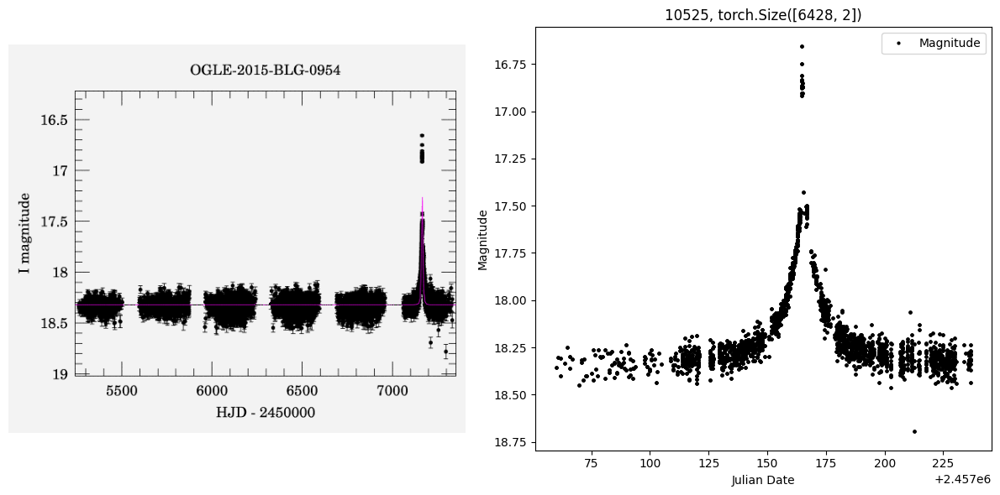

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


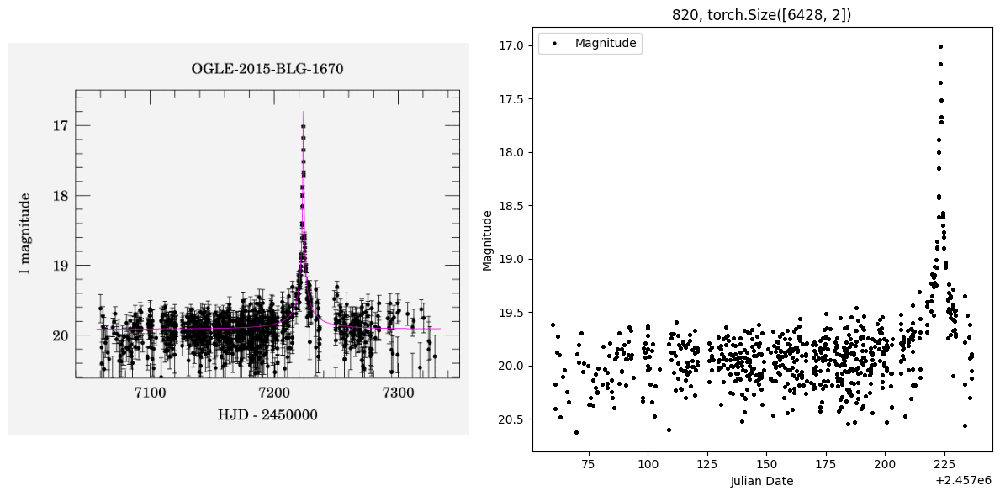

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


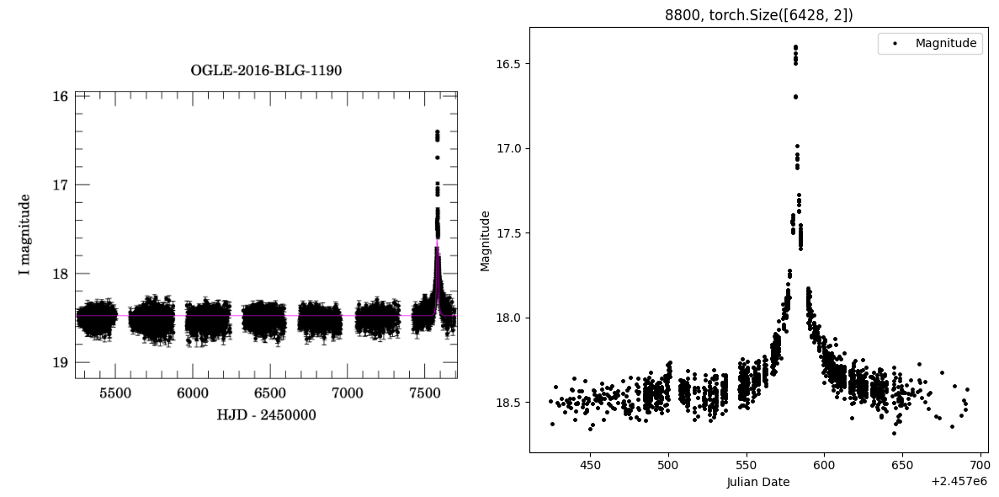

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


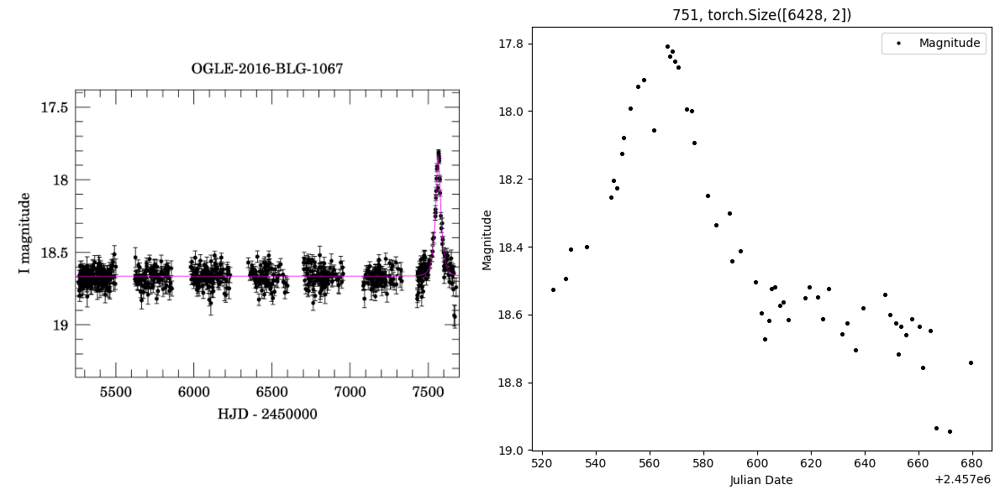

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


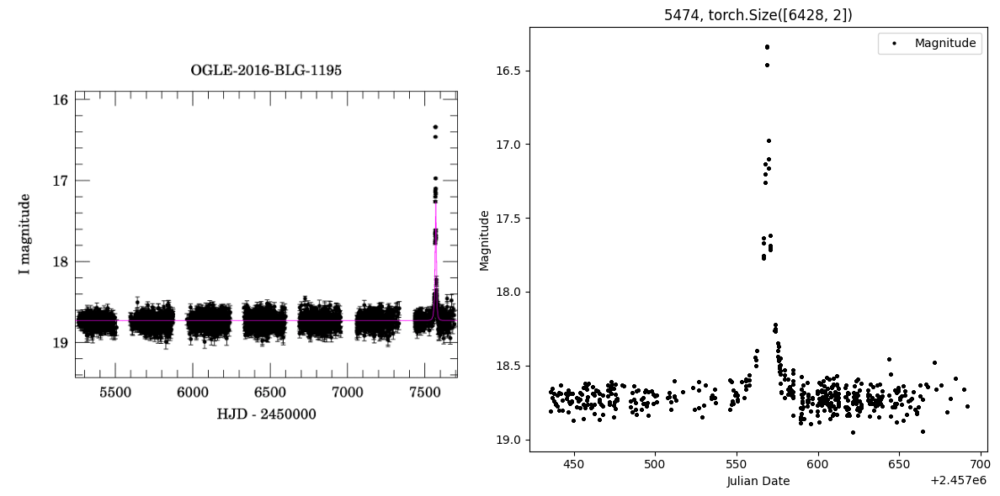

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


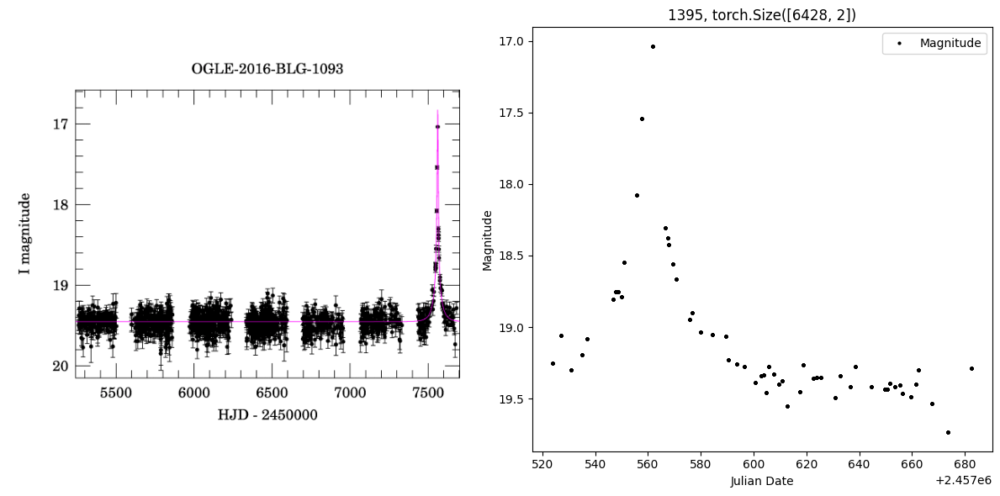

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


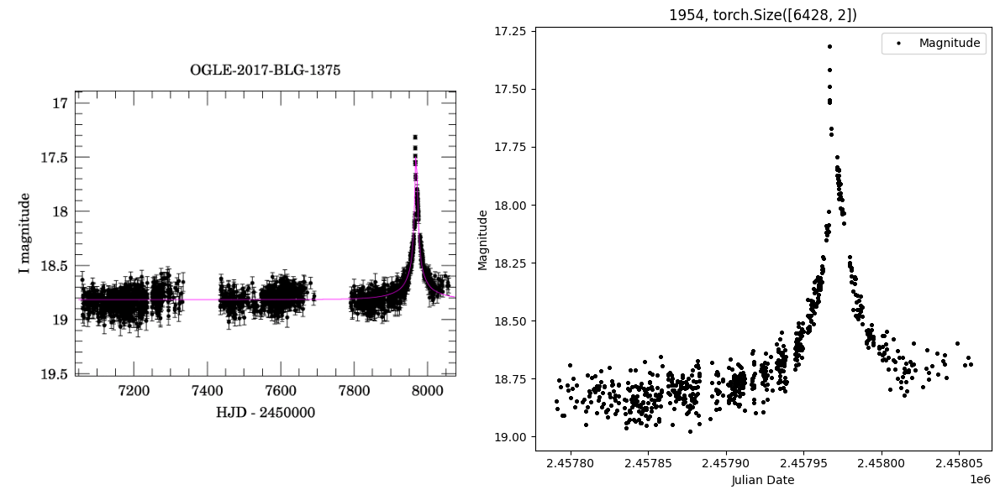

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


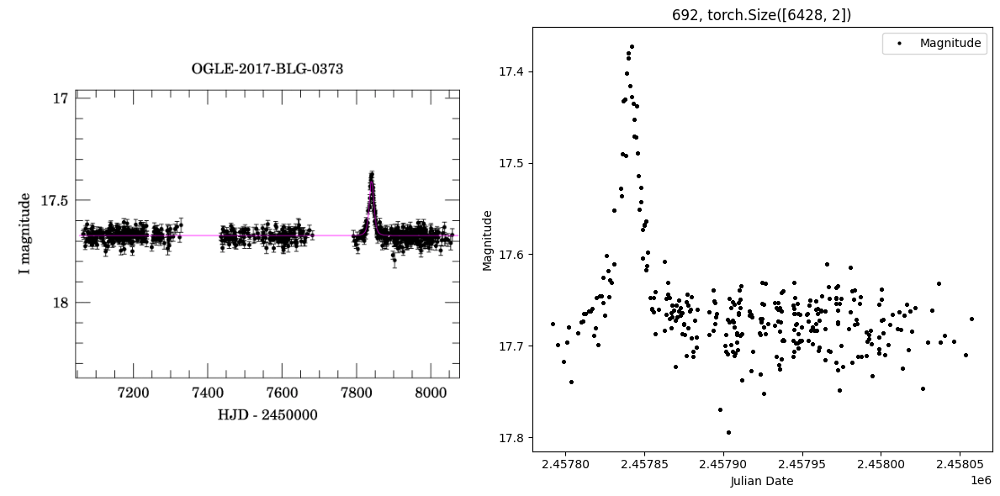

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


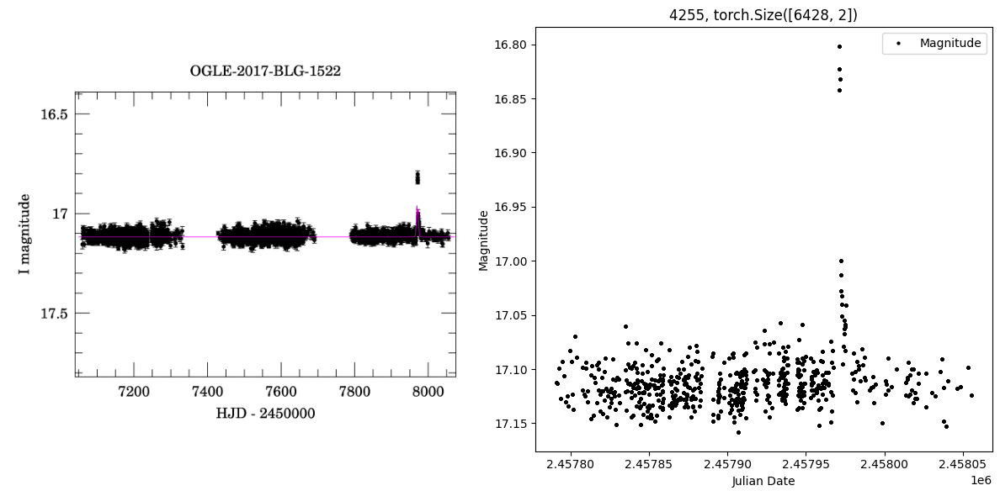

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


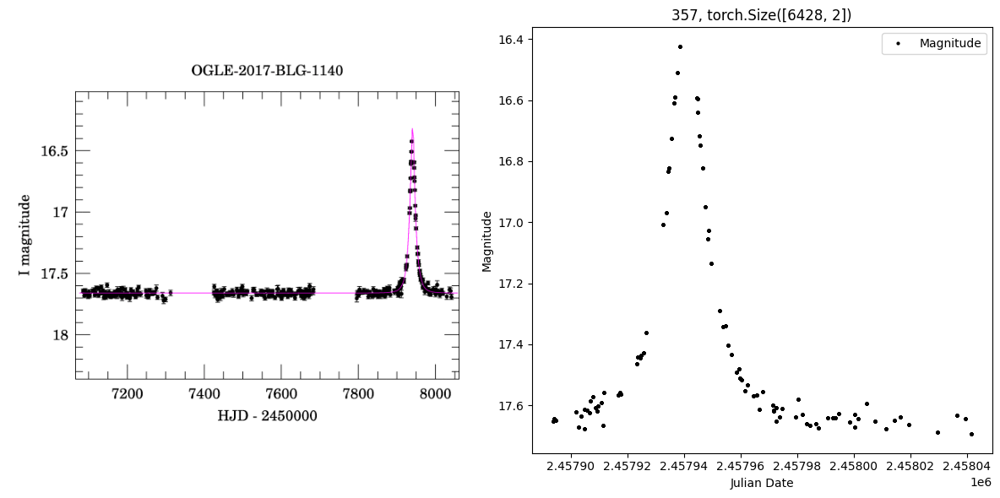

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


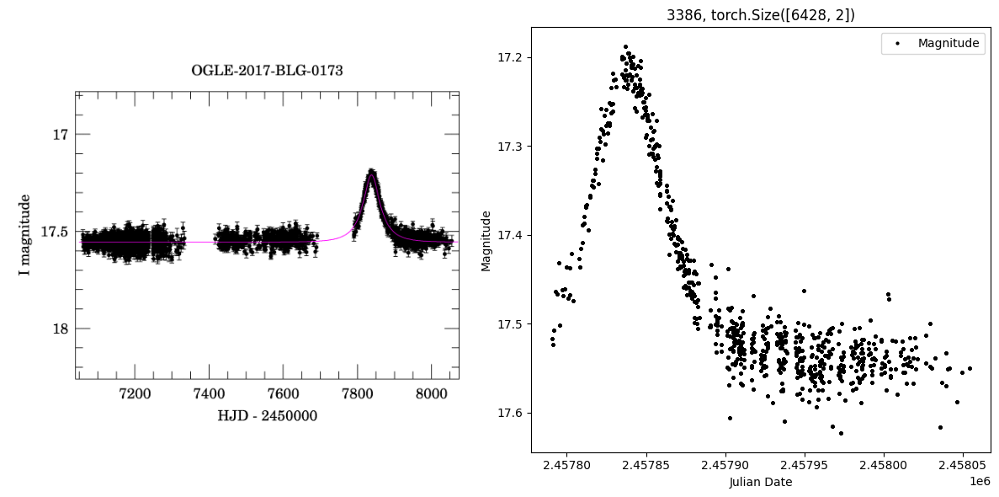

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


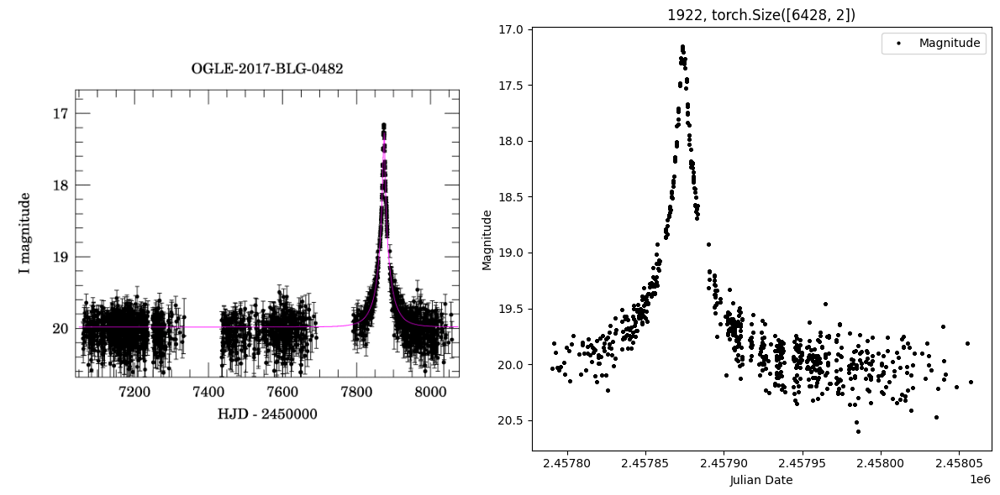

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


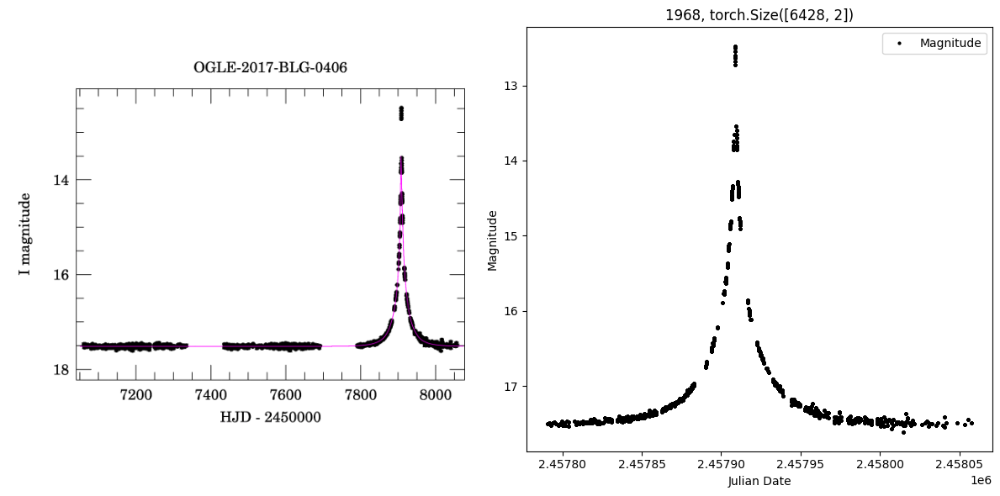

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


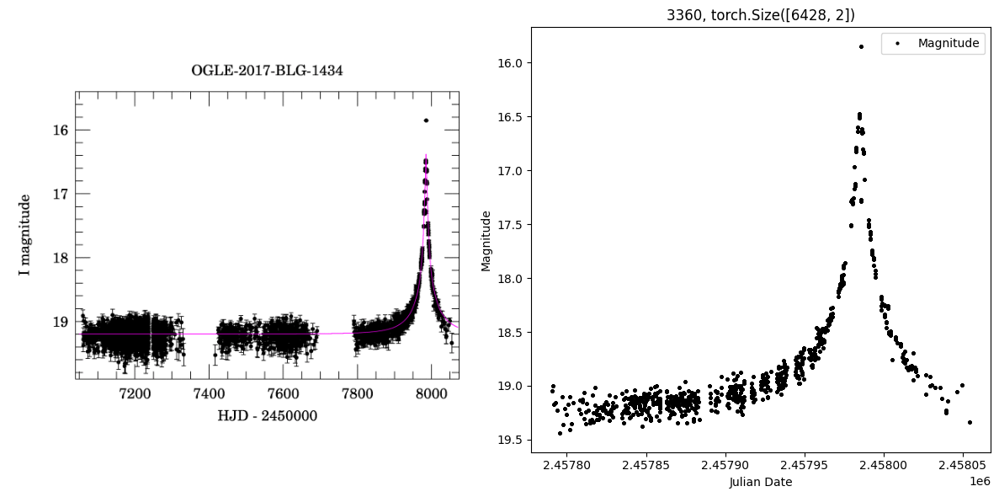

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


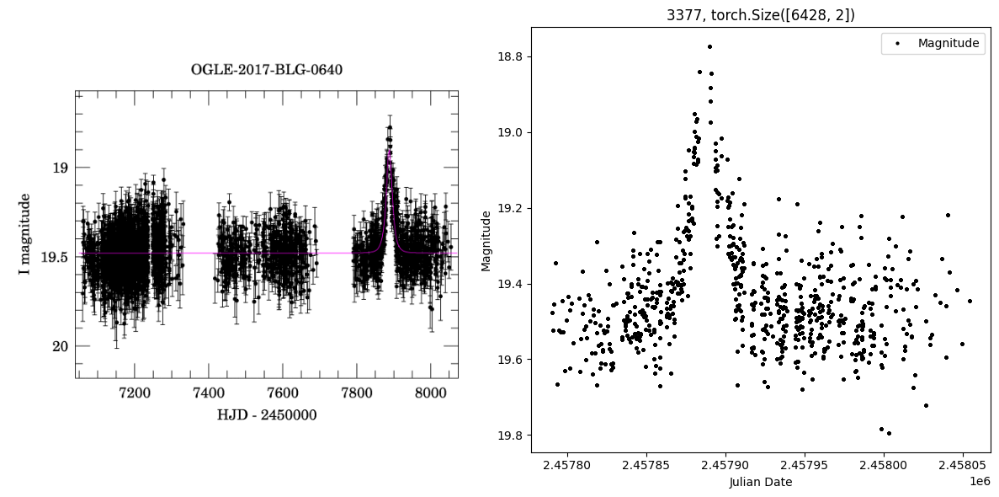

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


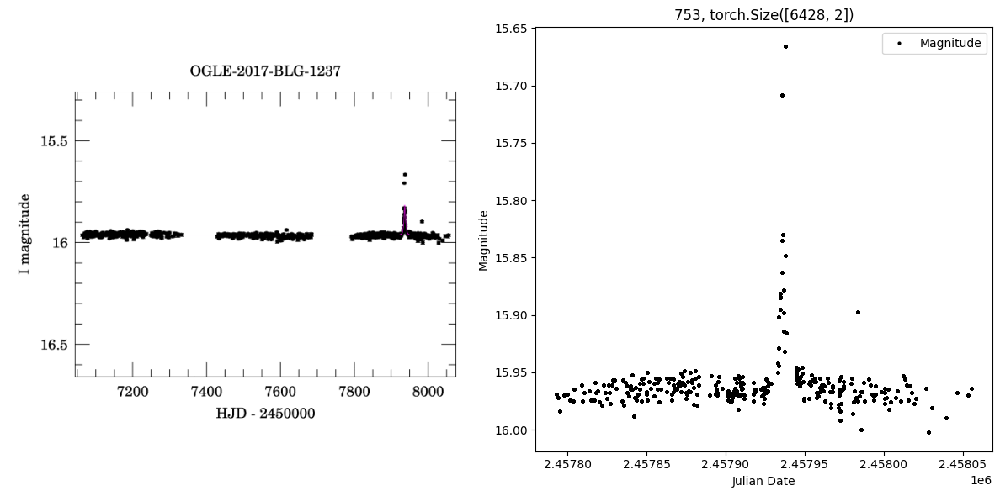

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


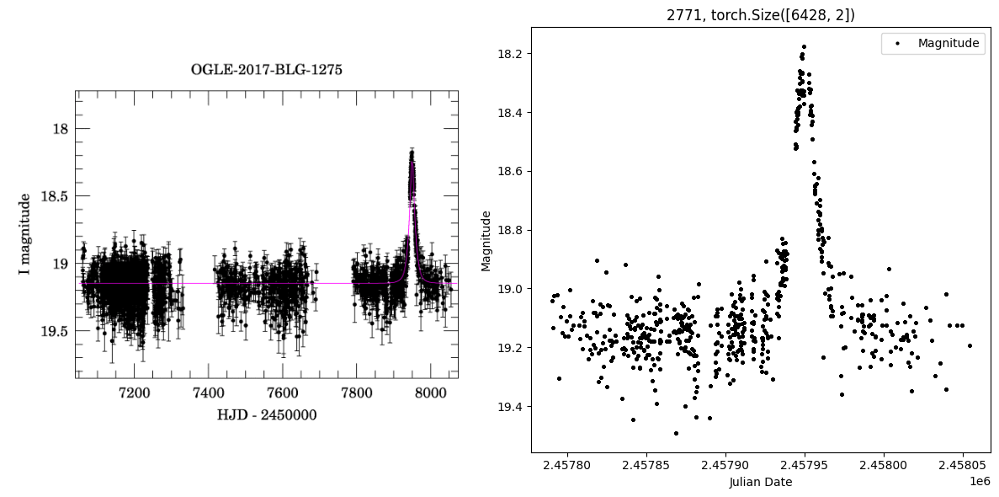

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


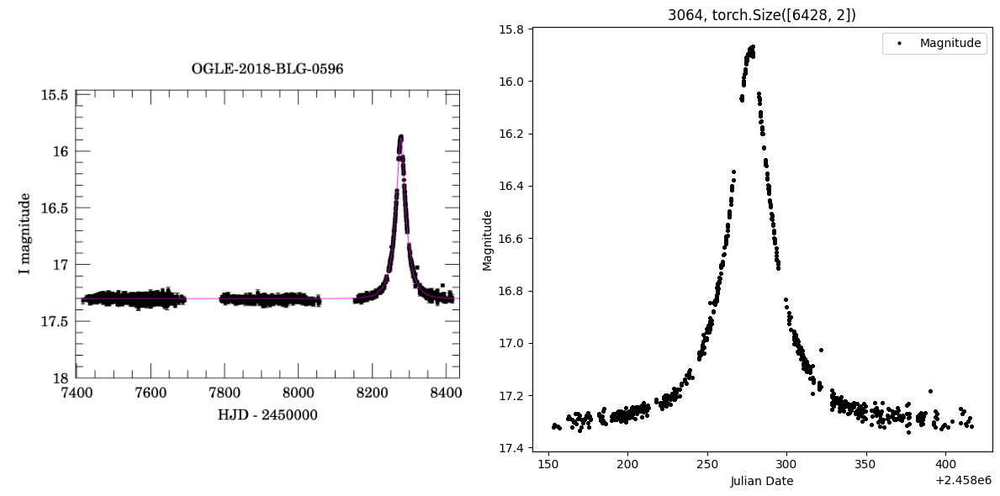

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


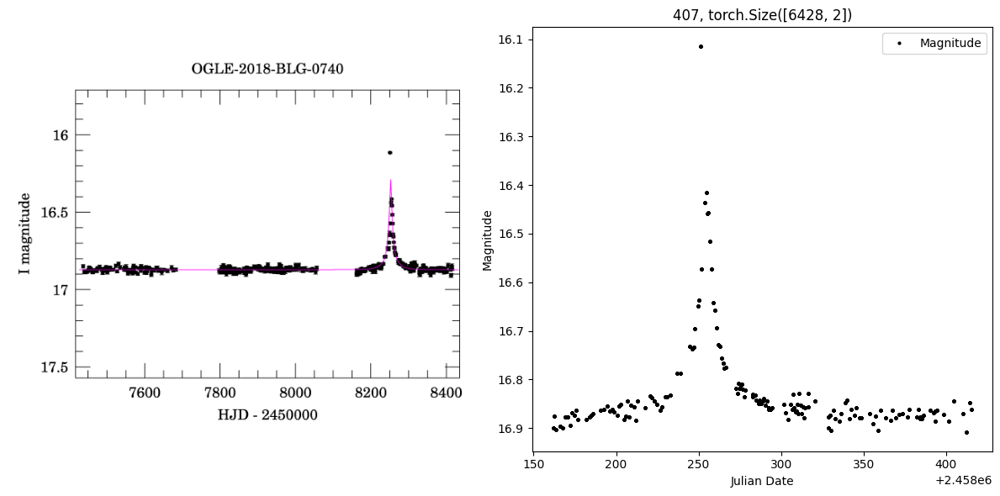

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


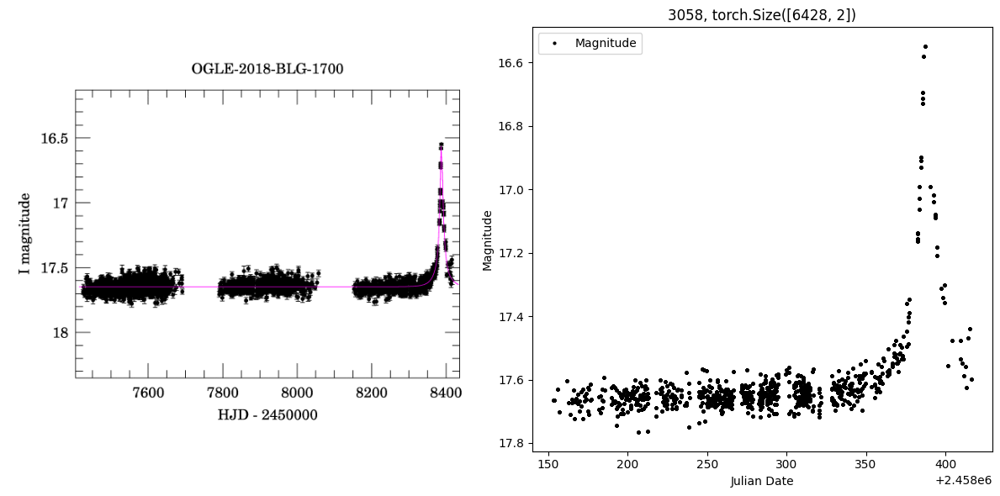

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


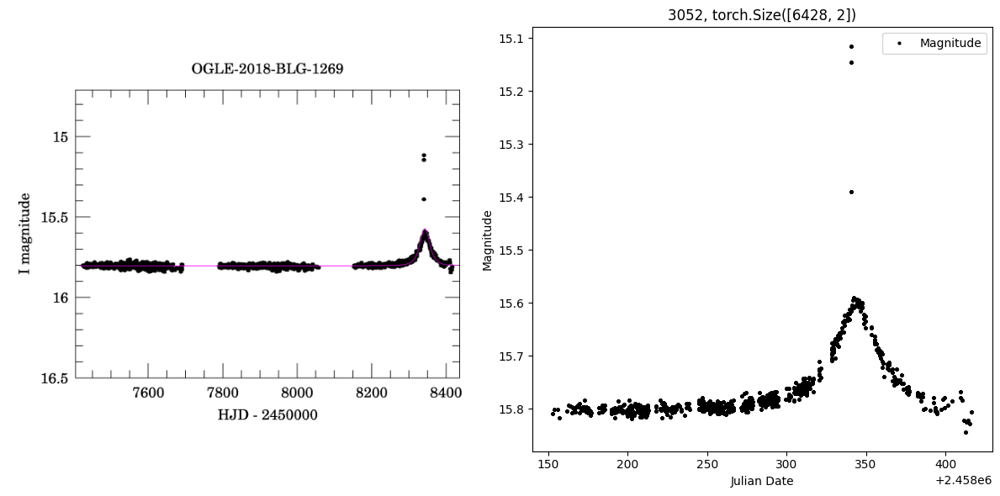

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


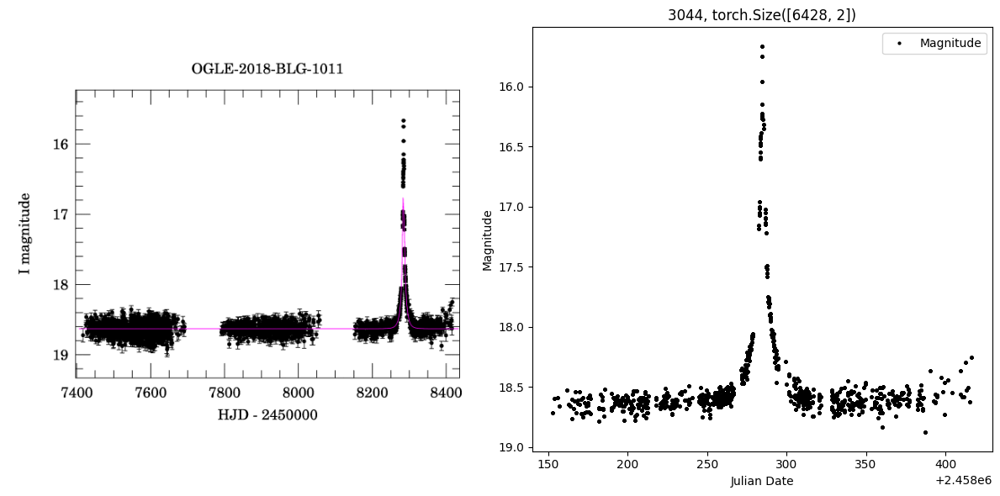

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


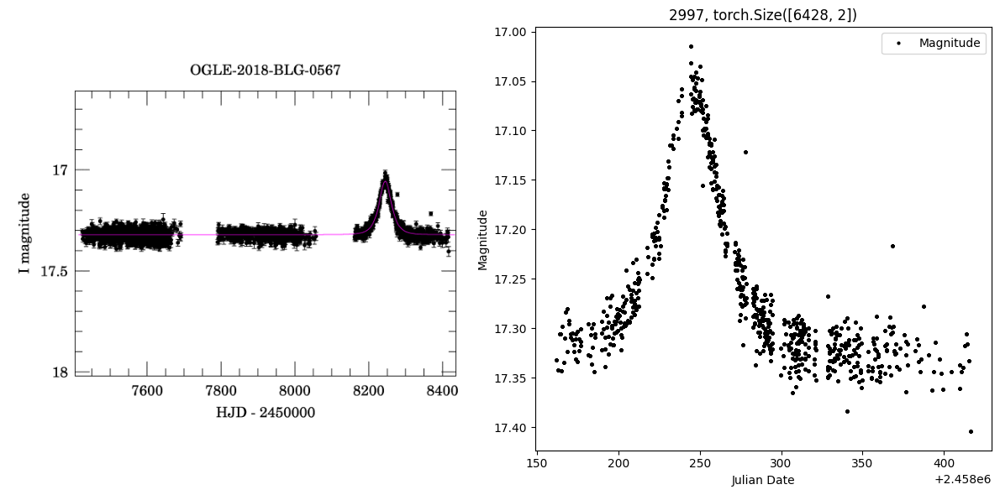

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


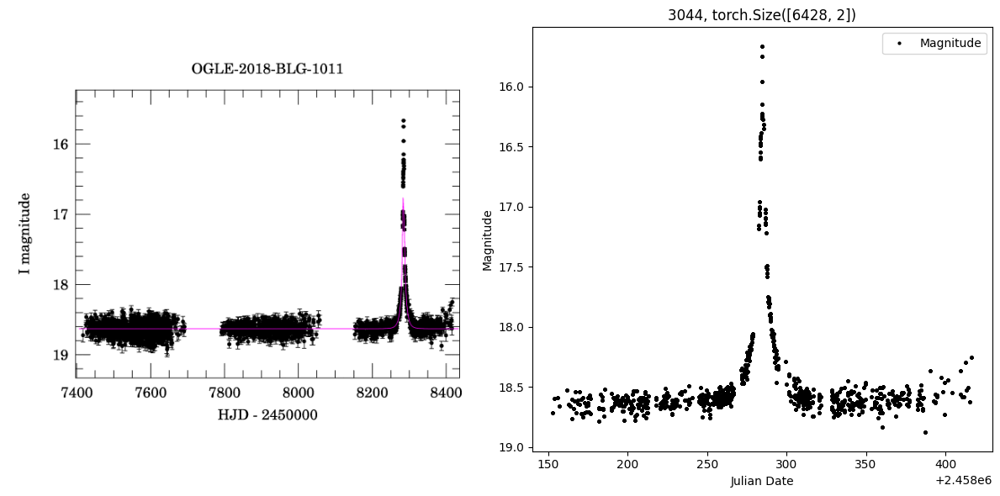

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


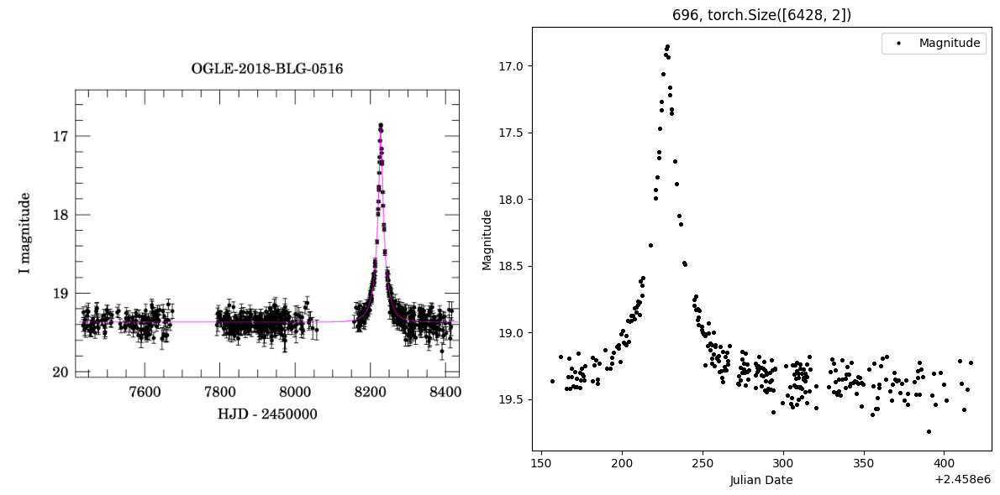

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


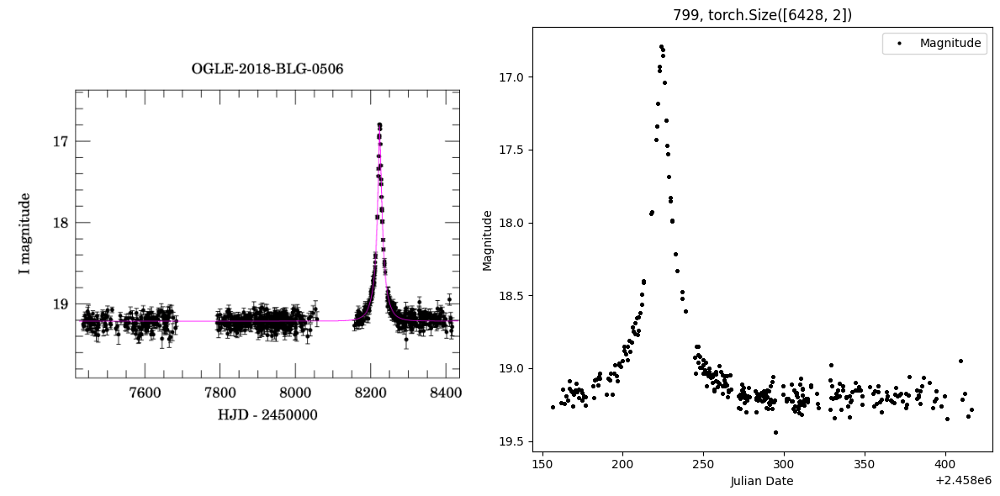

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


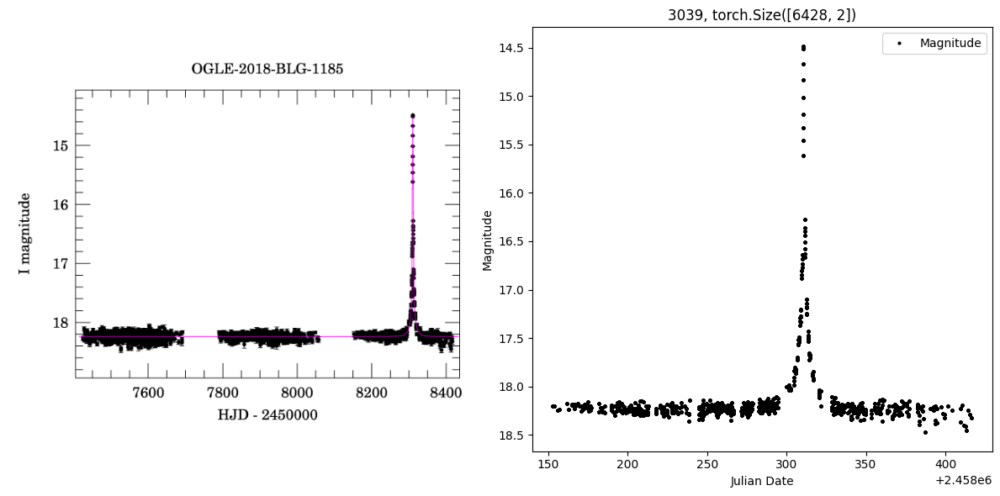

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


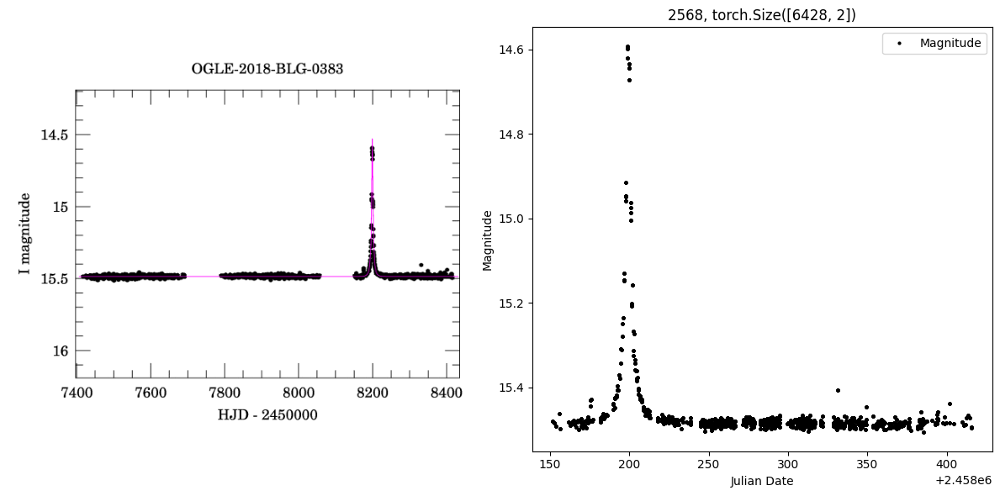

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


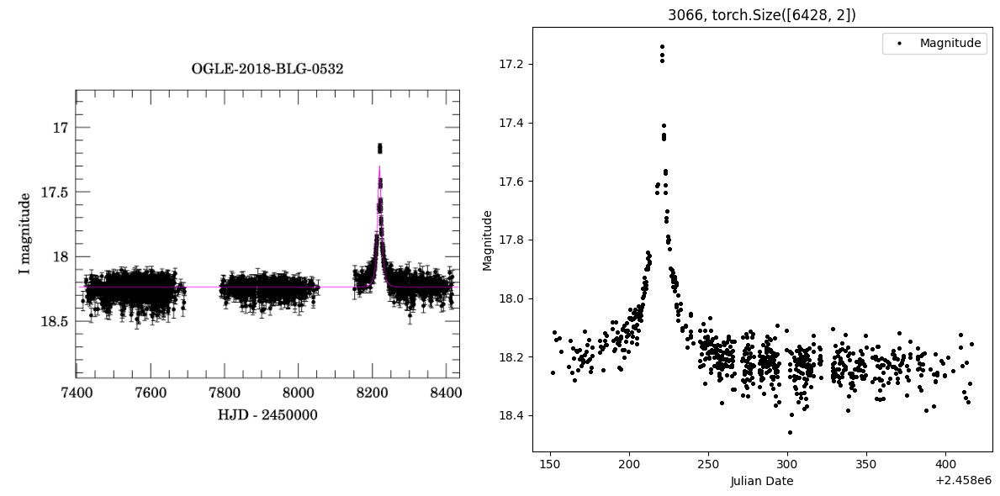

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


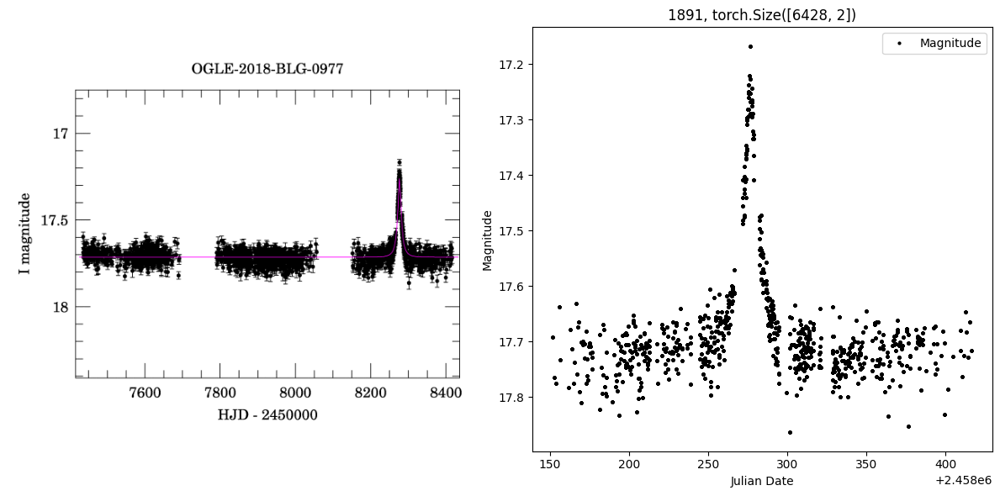

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


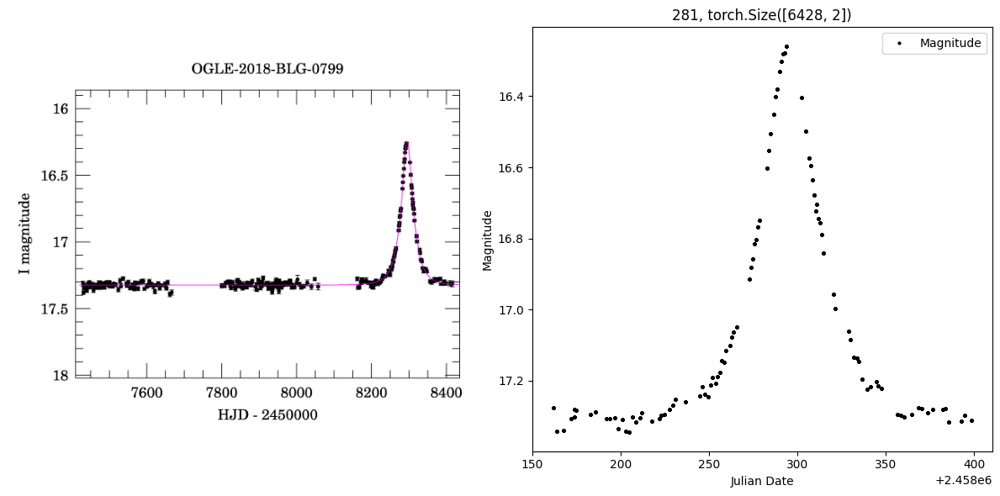

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


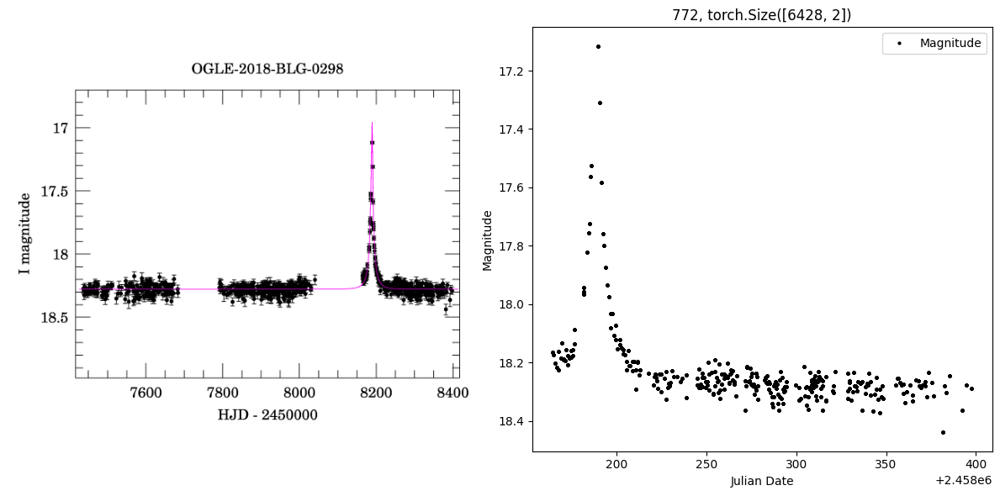

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


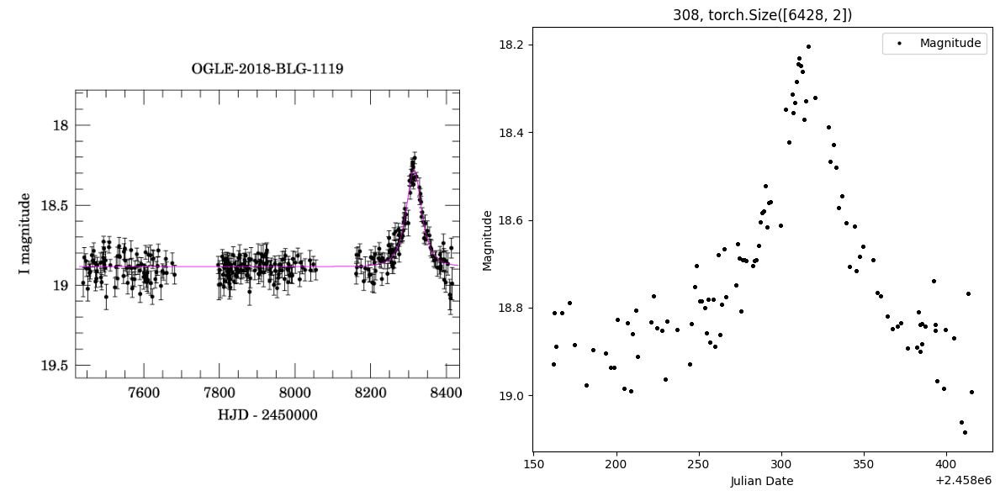

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


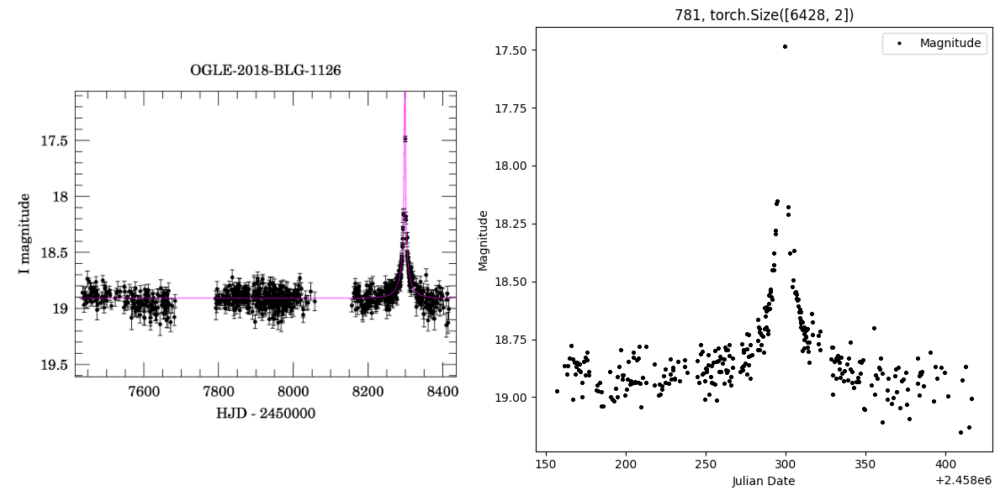

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


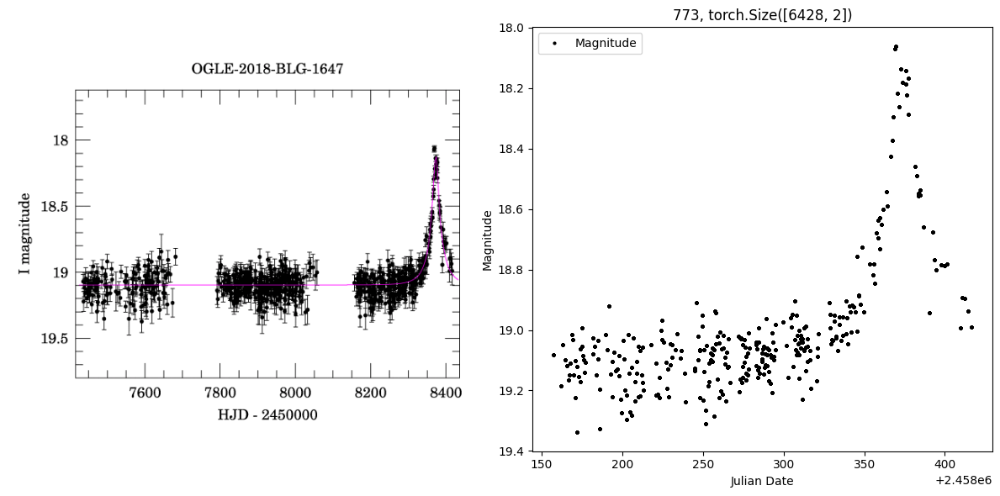

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


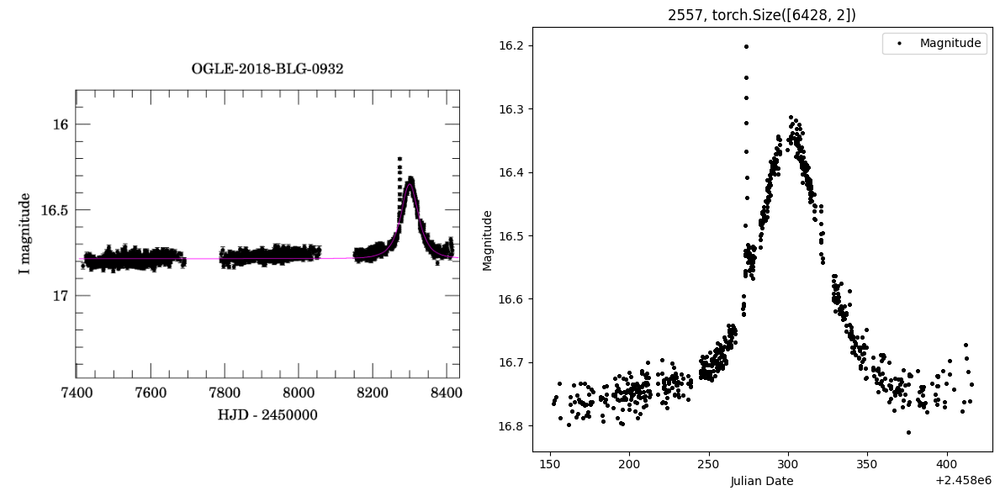

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


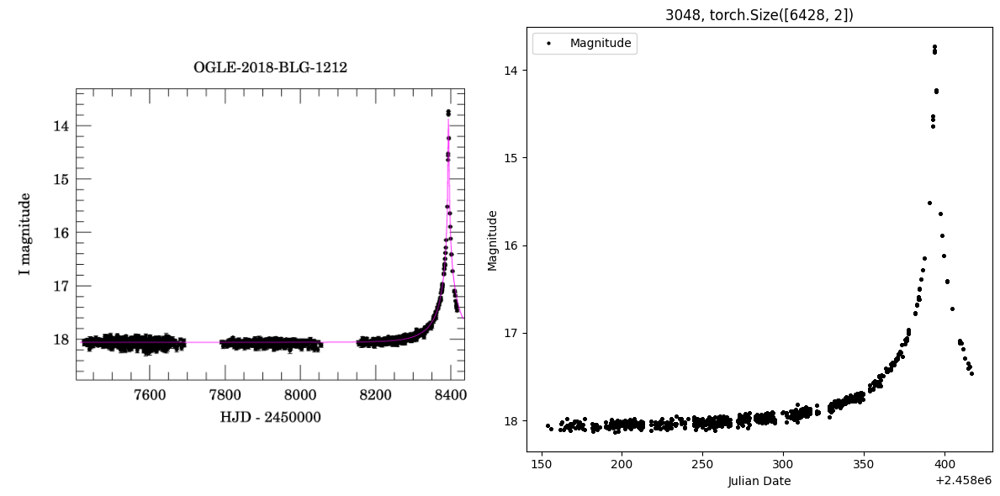

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


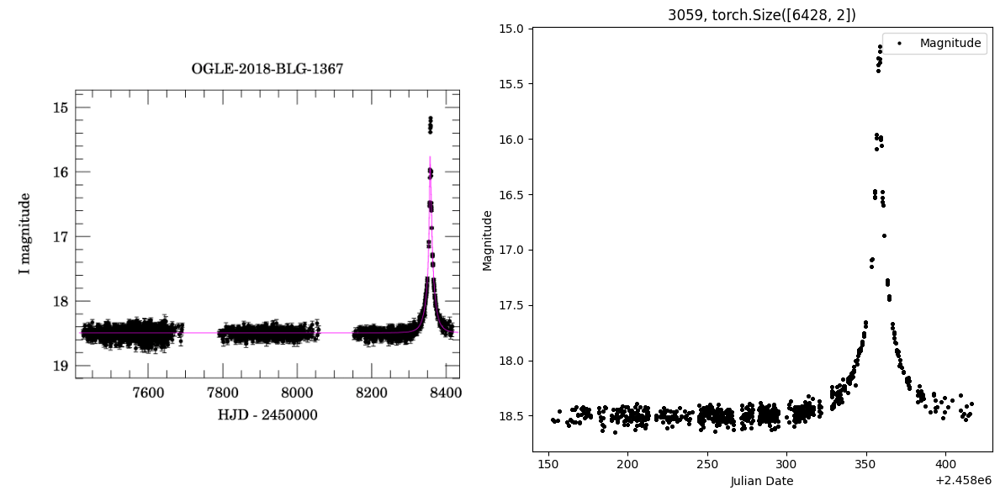

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


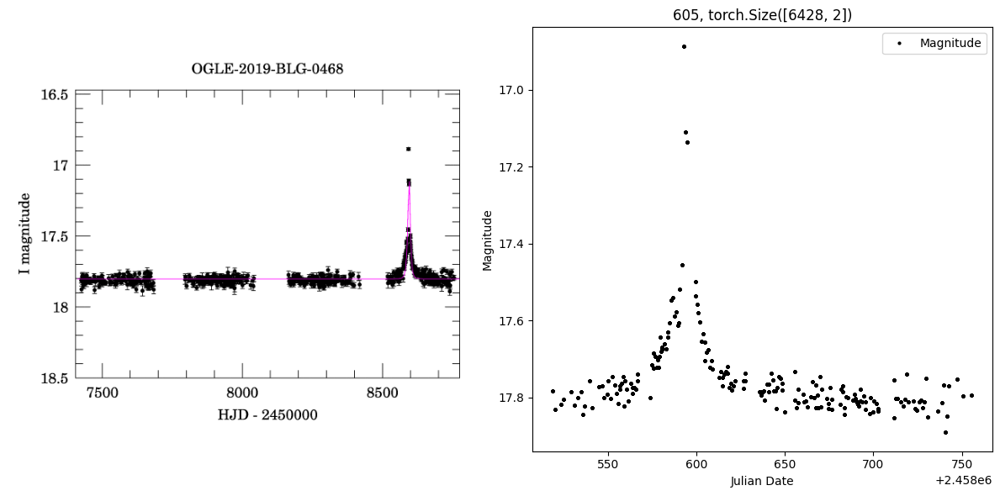

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


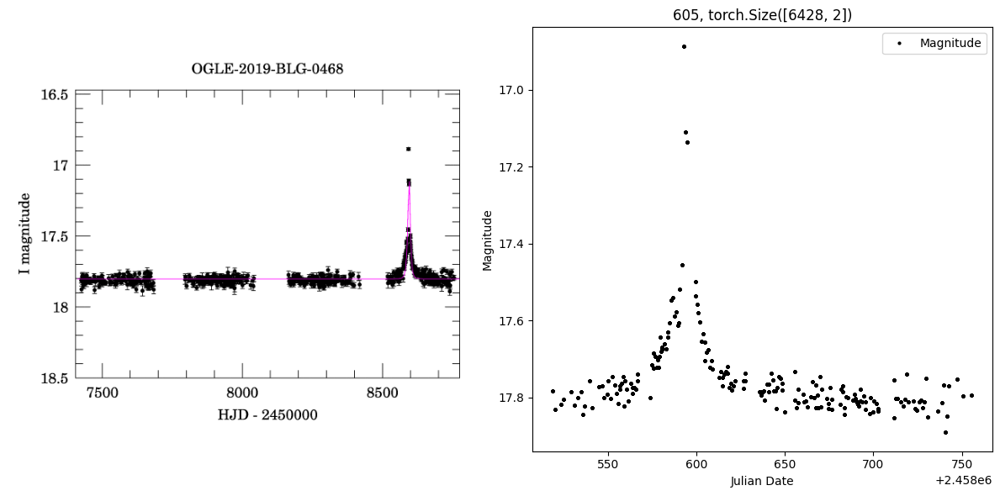

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


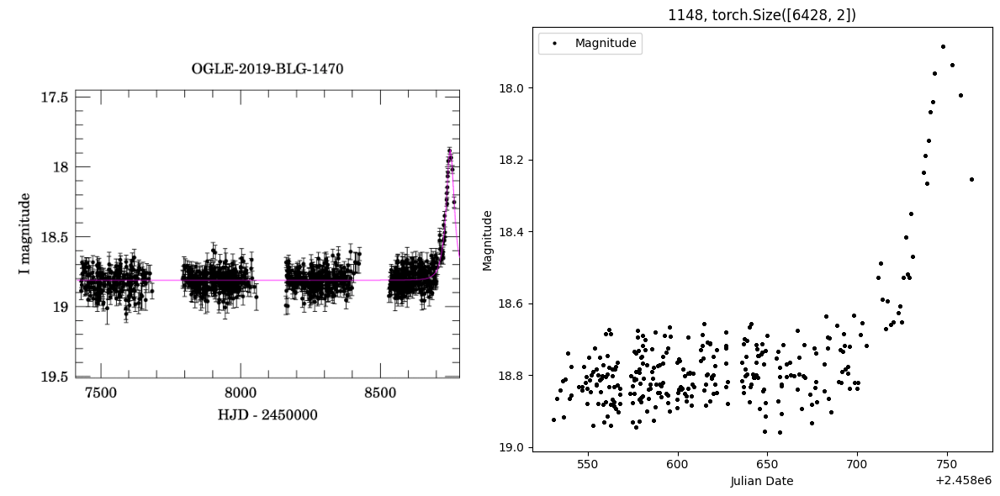

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


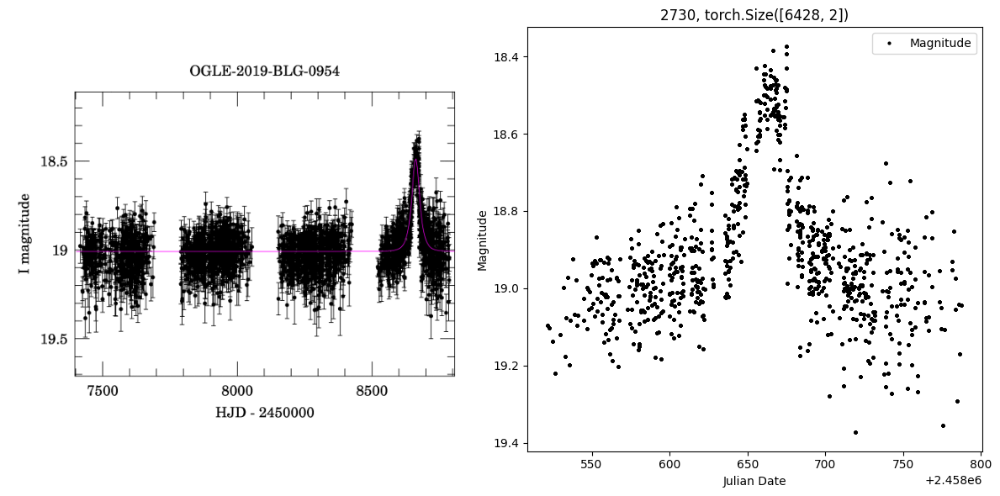

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


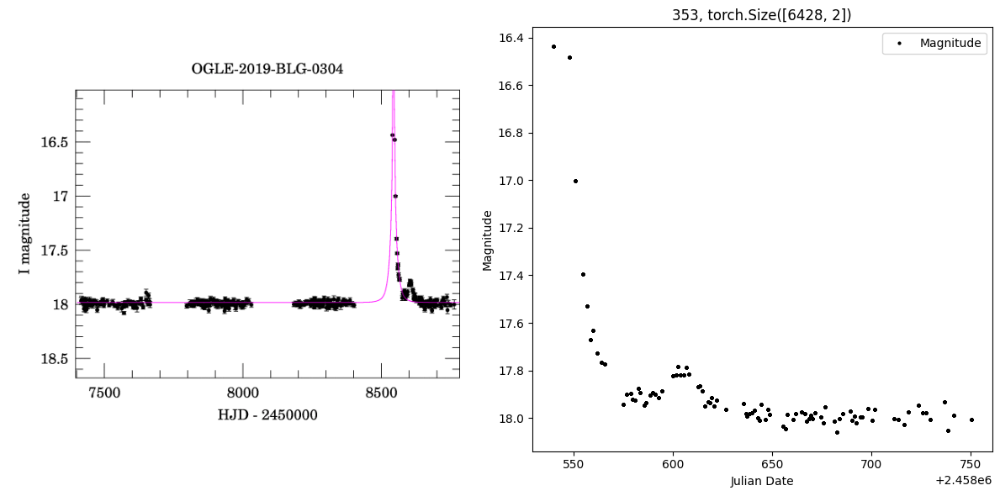

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


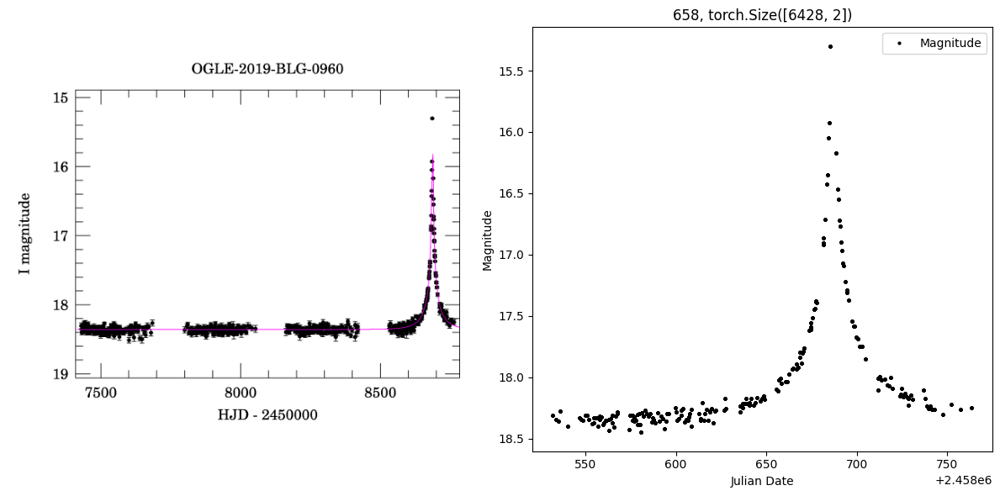

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


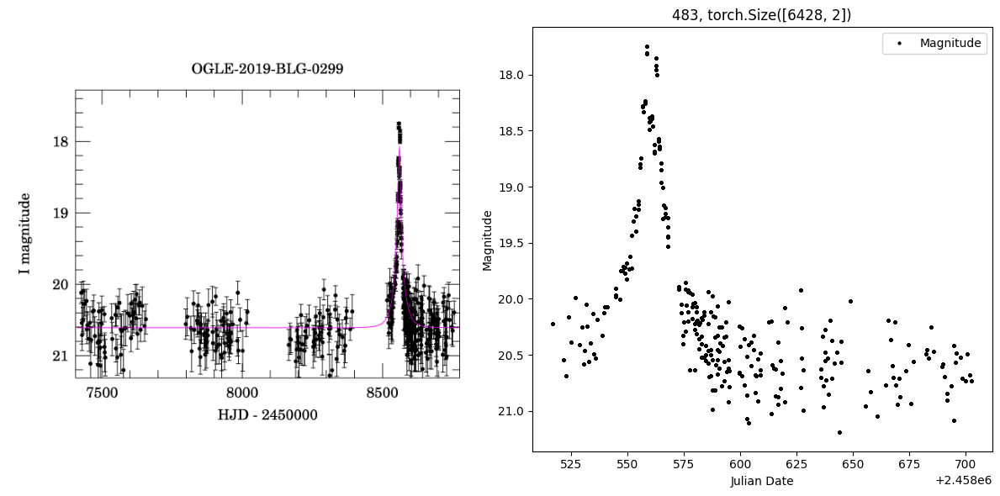

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


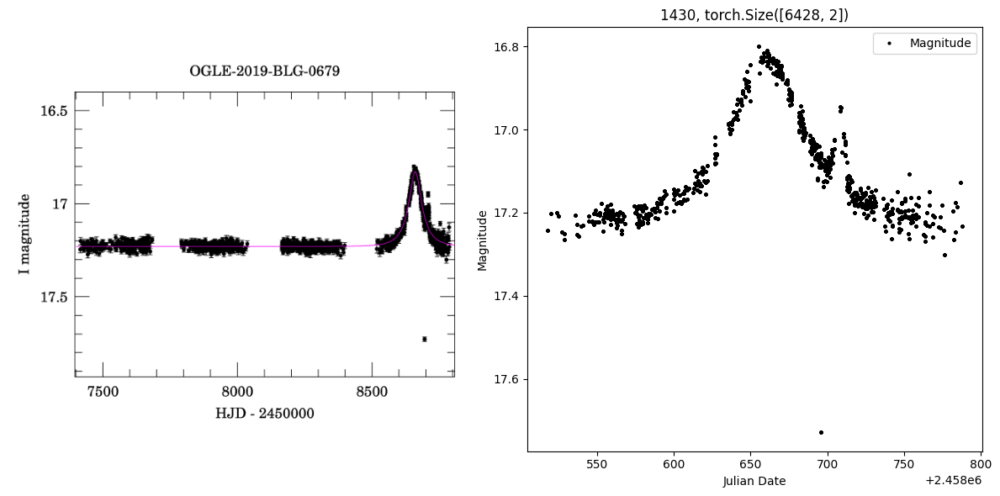

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


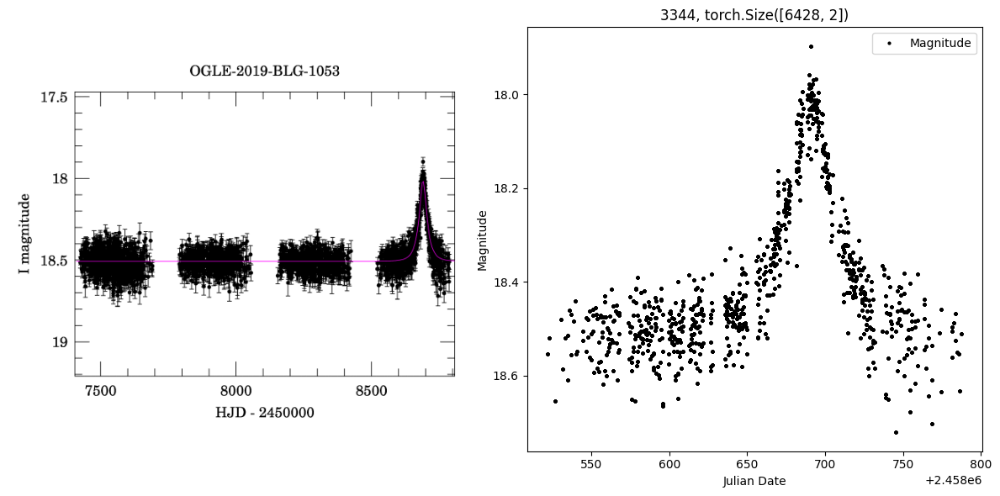

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


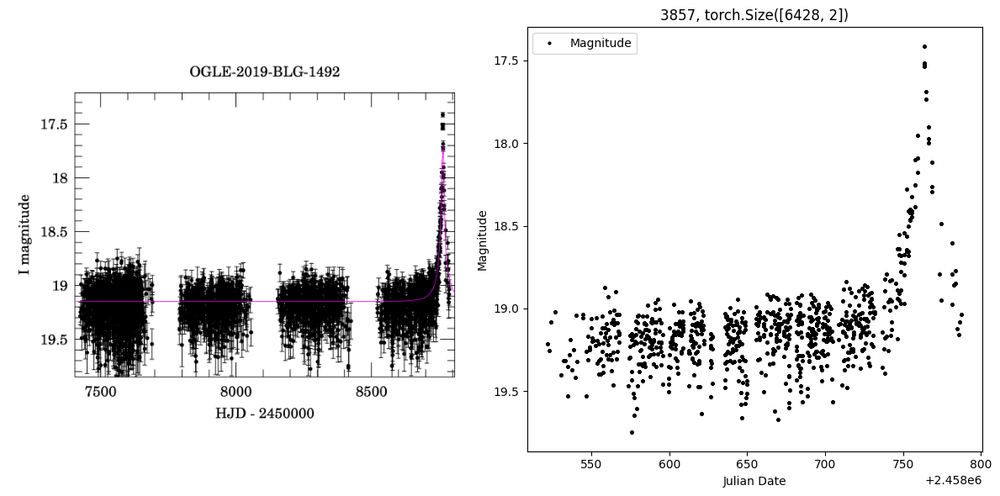

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


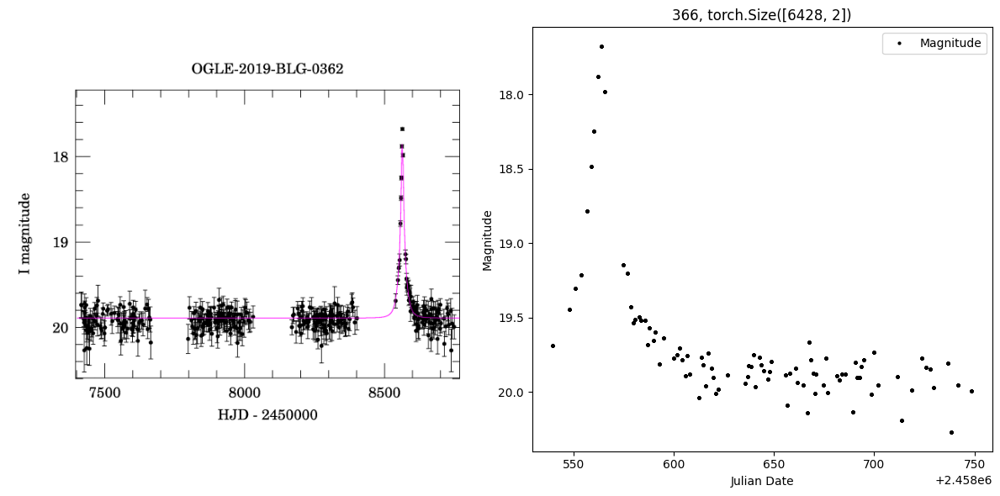

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


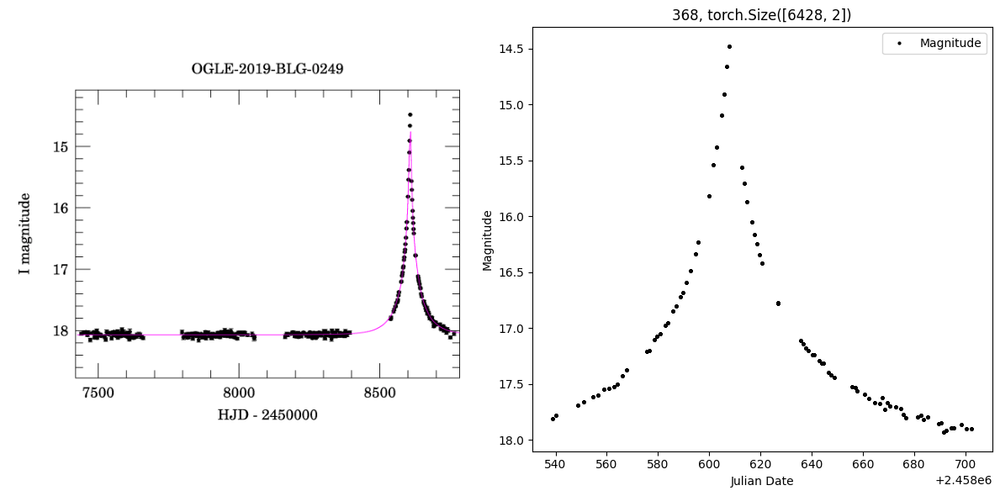

/opt/homebrew/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


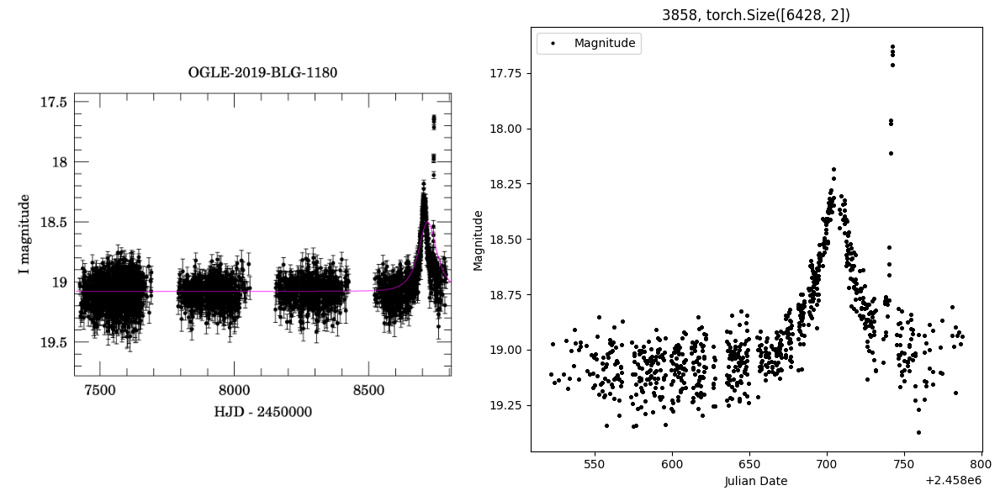

In [4]:
from astropy.timeseries import TimeSeries
from astropy.time import Time
from PIL import Image


# File path (assuming the directory structure remains the same)
file_path = '../Exodata/LightCurves/OGLE/2005/blg-169/phot.dat'

# Read the file into a pandas DataFrame
data = pd.read_csv(file_path, delim_whitespace=True, header=None)


def process_OGLE_and_plot(csv_file):
    df = pd.read_csv(csv_file)

    for index, row in df.iterrows():
        if row['Survey'] == 'OGLE' and row['type'] == 'exo':
            data_tensor = readOGLE(row['Filepath'] + '/phot.dat', threshold=10)
            data = pd.read_csv('../'+ row['Filepath'] + '/phot.dat')
            # Create a figure with two subplots
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

            # Construct the image path based on the current row's filepath
            img_path = '../' + row['Filepath'] + '/lcurve.gif'

            # Open the image for the current row

            try:
                img = Image.open(img_path)
                ax1.imshow(img)
                ax1.axis('off')  # Turn off axes for the image subplot
            except FileNotFoundError:
                # Handle cases where the image file might be missing
                print(f"Image not found: {img_path}")
                ax1.text(0.5, 0.5, "Image not found", ha='center', va='center')

            # Plot timeseries in second subplot
            time = Time(data_tensor[:, 0].numpy(), format='jd')
            time_series = TimeSeries(time=time, data={'magnitude': data_tensor[:, 1].numpy()})
            ax2.errorbar(time_series.time.jd, time_series['magnitude'], yerr=None, fmt='o', ecolor='gray', capsize=2, markersize=2, color='black', label='Magnitude')
            ax2.set_xlabel('Julian Date')
            ax2.set_ylabel('Magnitude')
            ax2.invert_yaxis()
            ax2.set_title(f"{len(data)}, {data_tensor.shape}")
            ax2.legend()

            # Adjust layout (optional)
            plt.tight_layout()

            plt.show()


# Example usage
csv_file = 'Second.csv'
process_OGLE_and_plot(csv_file)


# # Plot the light curve
# plt.figure(figsize=(10, 6))
# plt.errorbar(time_series.time.jd, time_series['magnitude'], yerr=time_series['error'], fmt='o', ecolor='gray', capsize=2, markersize=2, color='black', label='Magnitude')
# # plt.gca().invert_yaxis()  # Magnitude is inversely related to brightness
# plt.xlabel('Julian Date')
# plt.ylabel('Magnitude')
# plt.title('Light Curve')
# plt.legend()
# plt.show()

# x = readOGLE2('Exodata/LightCurves/OGLE/2005/blg-169/phot.dat', 100)

# plt.plot(x[:, 0].numpy(), x[:, 1].numpy(), 'o-')
# plt.xlabel('HJD')
# plt.ylabel('Magnitude')
# plt.title('HJD vs Magnitude')
# plt.grid(True)
# plt.show()


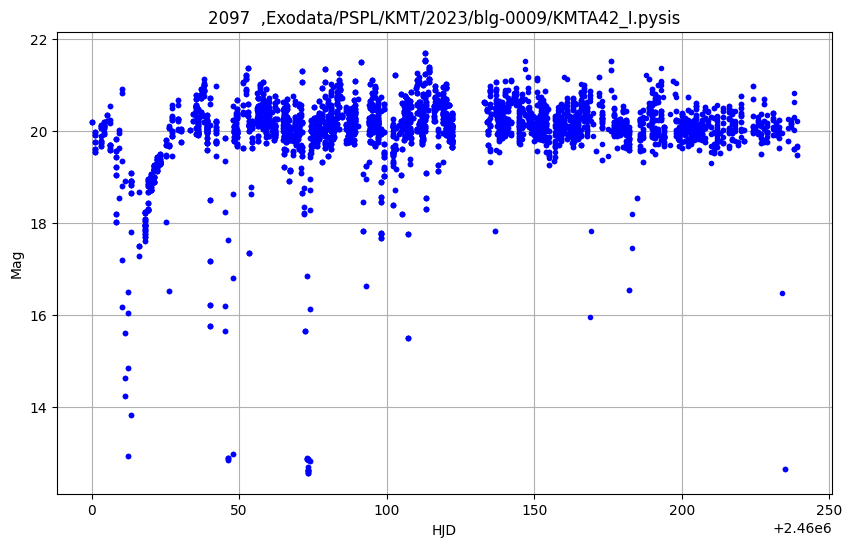

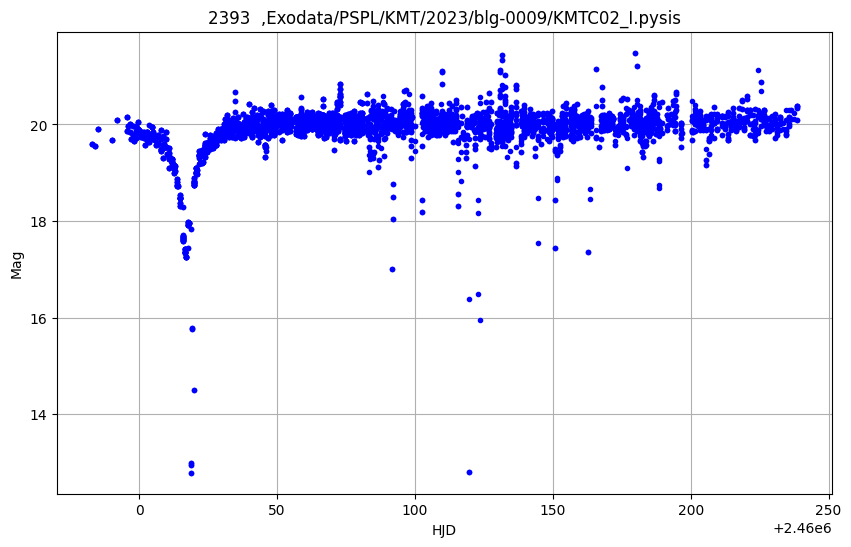

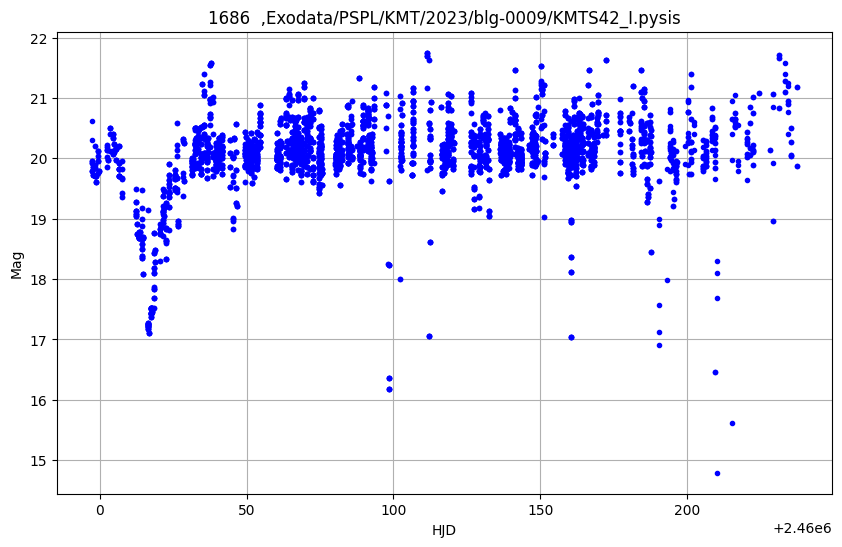

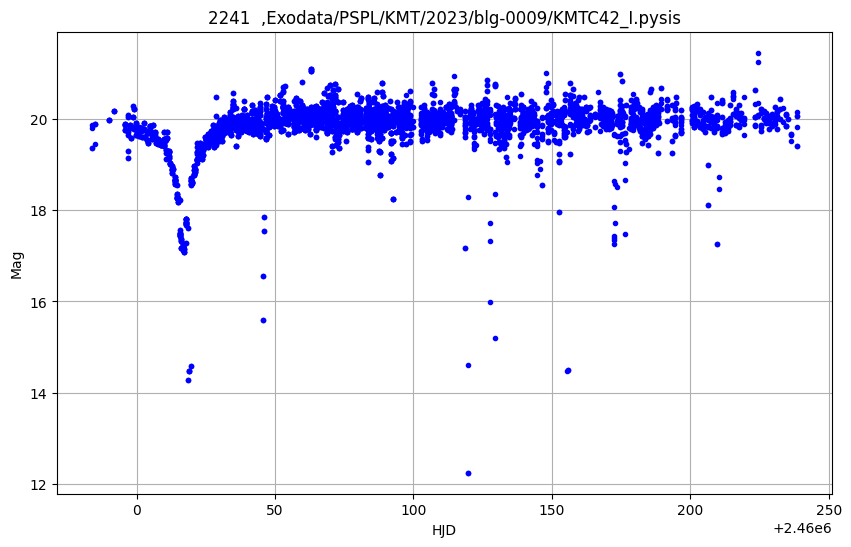

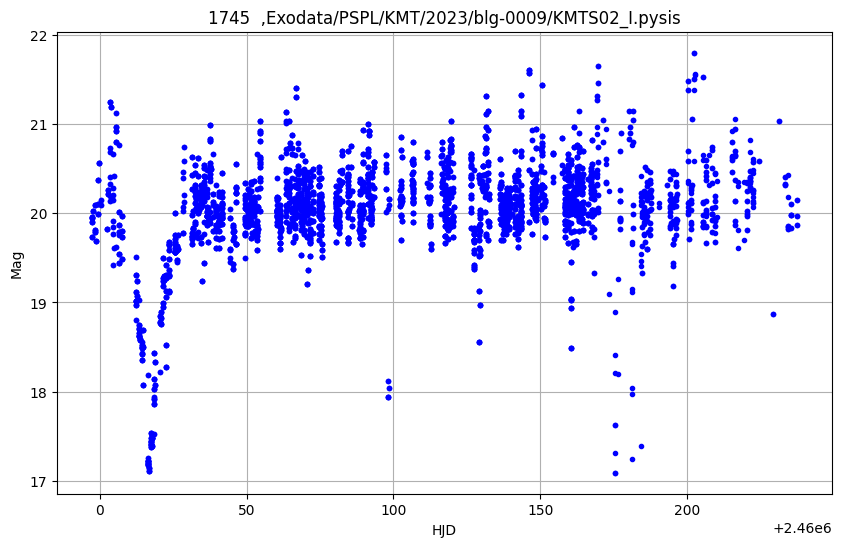

...

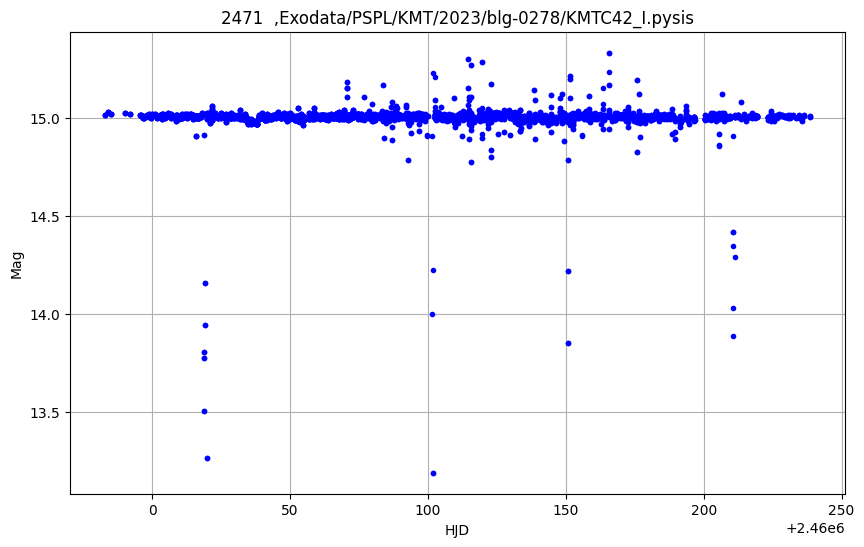

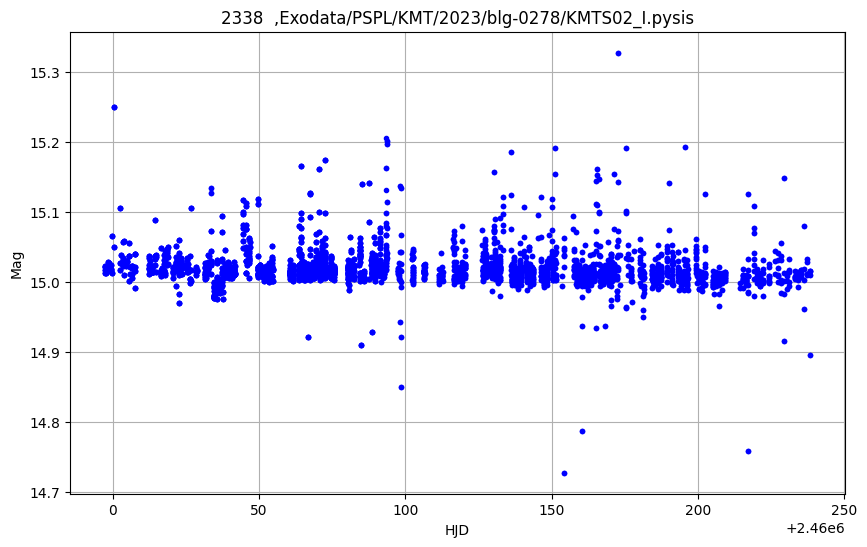

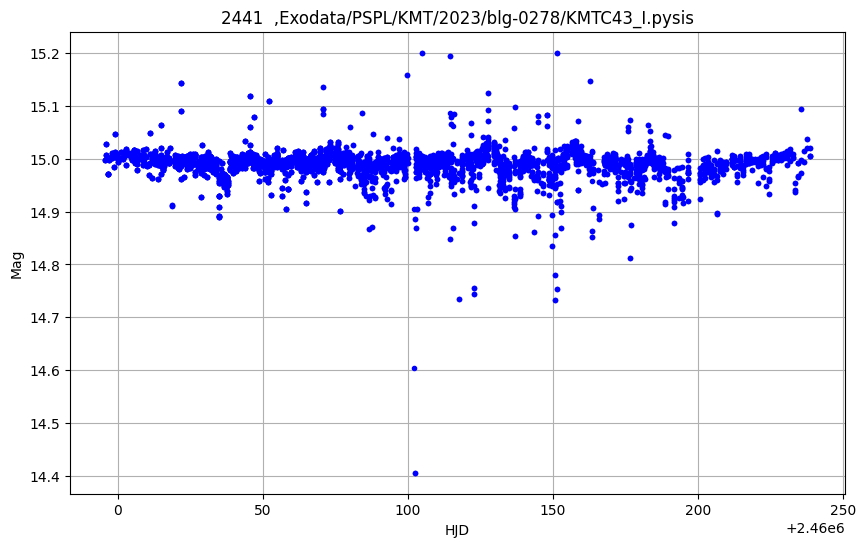

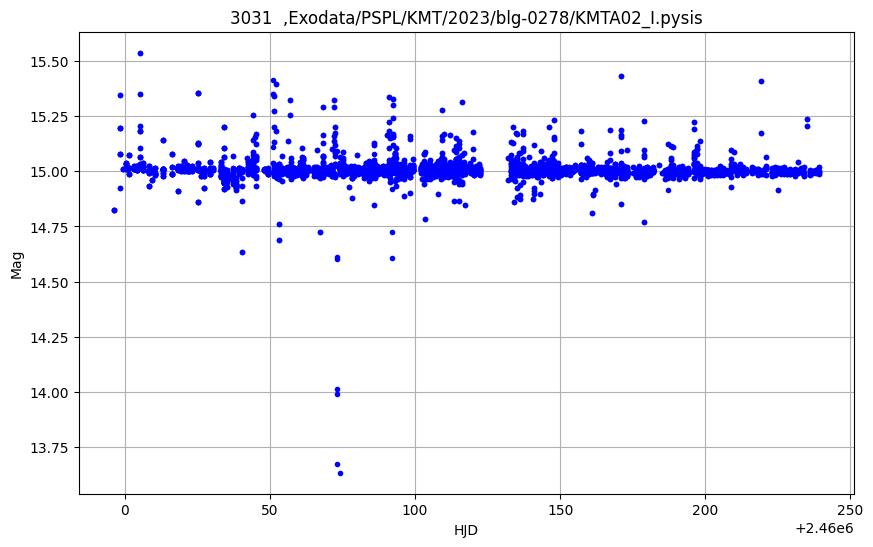

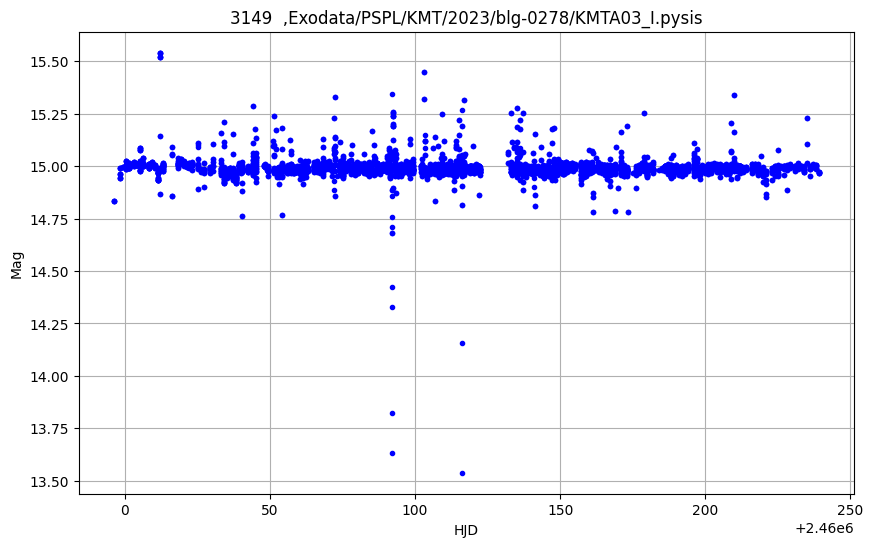

In [5]:
import warnings



def process_csv_and_plot(csv_file):
    df = pd.read_csv(csv_file)
    warnings.filterwarnings("ignore", message=".*DataFrame.swapaxes*")
    row_counts = []
    
    for index, row in df.iterrows():
        if row['Survey'] == 'KMT':
            data_tensor = readKMT2(row['Filepath'])
            
            # Plot HJD vs mag for the current data tensor
            x = data_tensor[:, 0].numpy()
            y = data_tensor[:, 1].numpy()
            data = pd.read_csv('../' + row['Filepath'])
            plt.figure(figsize=(10, 6))
            plt.plot(x, y, 'b.')
            plt.xlabel('HJD')
            plt.ylabel('Mag')
            plt.title(f"{len(data)}  ,{row['Filepath']}")
            plt.grid(True)
            plt.show()
# Example usage
csv_file = '../output.csv'
process_csv_and_plot(csv_file)

# data_tensor = readOGLE('Exodata/LightCurves/OGLE/2017/blg-0482/phot.dat')
# print(data_tensor.shape)

# x = data_tensor[:, 0].numpy()
# y = data_tensor[:, 1].numpy()

# plt.figure(figsize=(10, 6))
# plt.plot(x, y, 'b.')
# plt.xlabel('HJD')
# plt.ylabel('Mag')
# plt.title('')
# plt.grid(True)
# plt.show()

In [7]:
Next Steps,

Go through all of the visualizes of the lightcurves and eliminate any major bad pieces of data, and data I don't want/need. Assign Noise values to all the data as well 

Work on fixing all the functions to return the data tensor probably and then make a dataloader and figure out a way to make it work.

Then Work a VAE To DENOISE data, and maybe data generation?

Then train a BASELINE model on the data

Then Update the baseline and train your own model

Then hopefully get good results



SyntaxError: unterminated string literal (detected at line 3) (36185882.py, line 3)

torch.Size([6428, 2])


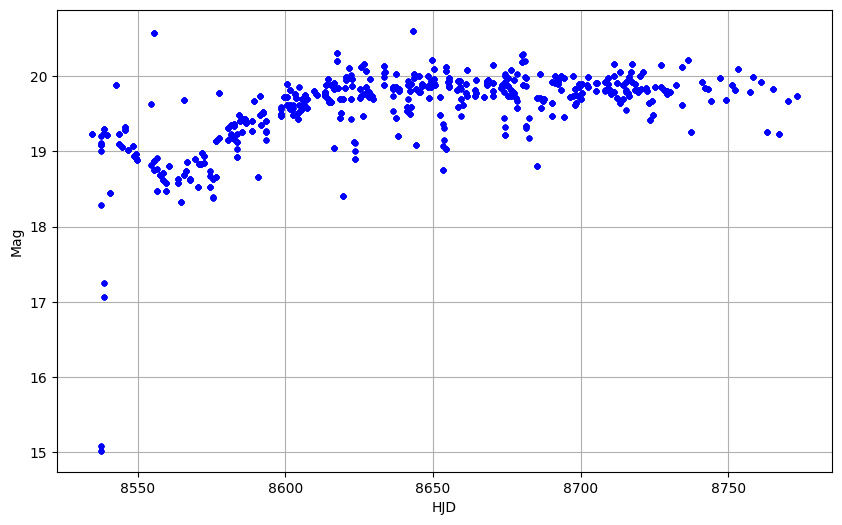

In [8]:

def process_WFIRST_and_plot(csv_file, threshold=1):

    df = pd.read_csv(csv_file)
    warnings.filterwarnings("ignore", message=".*DataFrame.swapaxes*")
    x = 0
    for index, row in df.iterrows():
        if row['type'] == 'exo' and int(row['noise']) <= 3:
            # # Read data from filepath with custom delimiters
            # data_tensor = read_and_process_WFIRST('../' + row['Filepath'], threshold)

            # # Extract HJD and Mag columns
            # x = data_tensor[:, 0]  # Use iloc for clarity
            # y = data_tensor[:, 1]

            # # Create plot
            # plt.figure(figsize=(10, 6))
            # plt.plot(x, y, 'b.')
            # plt.xlabel('HJD')
            # plt.ylabel('Mag')
            # plt.title(row['Filepath'])
            # plt.grid(True)
            # print(data_tensor.shape)
            # plt.show()
            x+=1
        # elif row['Survey'] == 'ROMAN' and row['type'] == 'exo':
        #     data_tensor = read_and_process_ROMAN('../' + row['Filepath'], threshold)

        #     # Extract HJD and Mag columns
        #     x = data_tensor[:, 0]  # Use iloc for clarity
        #     y = data_tensor[:, 1]

        #     # Create plot
        #     plt.figure(figsize=(10, 6))
        #     plt.plot(x, y, 'b.')
        #     plt.xlabel('HJD')
        #     plt.ylabel('Mag')
        #     plt.title(row['Filepath'])
        #     plt.grid(True)
        #     print(data_tensor.shape)
        #     plt.show()

# Example usage
# process_WFIRST_and_plot('../Exodata/metadata.csv')


data_tensor = readKMT2('Exodata/PSPL/KMT/2019/BLG-0074/KMTS16_I.pysis')
# Extract HJD and Mag columns
x = data_tensor[:, 0]  # Use iloc for clarity
y = data_tensor[:, 1]

# Create plot
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'b.')
plt.xlabel('HJD')
plt.ylabel('Mag')
plt.grid(True)
print(data_tensor.shape)
plt.show()


<>:41: SyntaxWarning: invalid escape sequence '\s'
<>:83: SyntaxWarning: invalid escape sequence '\s'
<>:135: SyntaxWarning: invalid escape sequence '\s'
<>:189: SyntaxWarning: invalid escape sequence '\s'
<>:41: SyntaxWarning: invalid escape sequence '\s'
<>:83: SyntaxWarning: invalid escape sequence '\s'
<>:135: SyntaxWarning: invalid escape sequence '\s'
<>:189: SyntaxWarning: invalid escape sequence '\s'
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_25112/913496607.py:41: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_25112/913496607.py:83: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath + '/phot.dat', sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_25112/913496607.py:135: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/var/f

In [9]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("MPS backend is available and will be used.")
else:
    device = torch.device("cpu")
    print("MPS backend is not available, using CPU instead.")


MPS backend is available and will be used.


In [10]:
import warnings

warnings.filterwarnings("ignore", category=FutureWarning, module='pandas', lineno=3773)

class TimeSeriesDataset(Dataset):
    def __init__(self, csv_file, threshold=0.1, target_rows=6428):
        self.data = pd.read_csv(csv_file)
        self.samples = []
        self.threshold = threshold
        self.target_rows = target_rows

        for _, row in self.data.iterrows():
            data_type = row['type']
            data_survey = row['Survey']
            label = 1 if data_type == 'exo' else 0

            if data_survey == 'KMT':
                data = self.readKMT2(row['Filepath'])
            elif data_survey == 'OGLE':
                data = self.readOGLE(row['Filepath'])
            elif data_survey == 'ROMAN':
                data = self.read_and_process_ROMAN(row['Filepath'])
            elif data_survey == 'ROMAN SAGAN':
                data = self.read_and_process_WFIRST(row['Filepath'])
            else:
                continue

            self.samples.append((data, label))
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        data, label = self.samples[idx]
        return data, torch.tensor(label, dtype=torch.long)
    
    def readKMT2(self, filepath):
        data = pd.read_csv("../" + filepath, sep='\s+', header=None)
        data = data.apply(pd.to_numeric, errors='coerce')
        data = data.dropna(subset=[data.columns[0], data.columns[3]])
        data['x_diff'] = data[data.columns[0]].diff().abs()
        gap_indices = data[data['x_diff'] > self.threshold].index
        split_dataframes = np.array_split(data, gap_indices)
        total_rows = sum(df.shape[0] for df in split_dataframes)
        padded_dataframes = []

        if total_rows < self.target_rows:
            loop_count = 0
            while total_rows < self.target_rows:
                loop_count += 1
                for df in split_dataframes:
                    noise = np.random.normal(0, 1e-8, size=(df.shape[0], 2))
                    new_values = df[[data.columns[0], data.columns[3]]].values + noise
                    new_df = pd.DataFrame(new_values, columns=[data.columns[0], data.columns[3]])
                    padded_dataframes.append(df[[data.columns[0], data.columns[3]]])
                    padded_dataframes.append(new_df)
                    total_rows += new_df.shape[0]
                    if total_rows >= self.target_rows:
                        break
            combined_dataframe = pd.concat(padded_dataframes, ignore_index=True)
            combined_dataframe = combined_dataframe.iloc[:self.target_rows]
        else:
            combined_dataframe = pd.concat(split_dataframes, ignore_index=True)
            combined_dataframe = combined_dataframe.iloc[:self.target_rows]

        magnitudes = combined_dataframe[data.columns[3]].values
        for i in range(1, len(magnitudes) - 1):
            if abs(magnitudes[i] - magnitudes[i-1]) > 0.3 and abs(magnitudes[i] - magnitudes[i+1]) > 0.3:
                avg_neighbor_magnitude = (magnitudes[i-1] + magnitudes[i+1]) / 2
                if magnitudes[i] > avg_neighbor_magnitude:
                    magnitudes[i] = avg_neighbor_magnitude + 0.1
                else:
                    magnitudes[i] = avg_neighbor_magnitude - 0.1
        combined_dataframe[data.columns[3]] = magnitudes

        # Convert to tensor with shape (2, target_rows)
        data_tensor = torch.tensor(combined_dataframe[[data.columns[0], data.columns[3]]].values.T, dtype=torch.float32)
        return data_tensor
    
    def readOGLE(self, filepath):
        data = pd.read_csv("../" + filepath + '/phot.dat', sep='\s+', header=None)
        data['x_diff'] = data[0].diff().abs()
        gap_indices = data[data['x_diff'] > self.threshold].index
        dfs = np.array_split(data, gap_indices)
        dfs = [df[(df[0] > 1e-6) & (df[1] > 1e-6)] for df in dfs if len(df) > 0]

        if not dfs:
            raise ValueError("No valid groups found.")

        min_avg_value = float('inf')
        min_avg_group_df = None
        for group in dfs:
            avg = group[1].mean()
            if avg < min_avg_value:
                min_avg_value = avg
                min_avg_group_df = group

        selected_df = min_avg_group_df
        data_tensor = torch.tensor(selected_df[[0, 1]].values.T, dtype=torch.float32)

        def downsample_tensor(data_tensor, target_length):
            current_length = data_tensor.shape[1]
            if current_length <= target_length:
                return data_tensor
            indices_to_remove = np.linspace(0, current_length - 1, current_length - target_length, dtype=int)
            mask = np.ones(current_length, dtype=bool)
            mask[indices_to_remove] = False
            downsampled_tensor = data_tensor[:, mask]
            return downsampled_tensor

        def augment_tensor(data_tensor, target_length):
            current_length = data_tensor.shape[1]
            if current_length >= target_length:
                return data_tensor[:, :target_length]
            while current_length < target_length:
                noise = torch.normal(0, 1e-8, size=data_tensor.shape)
                new_data = data_tensor + noise
                data_tensor = torch.cat((data_tensor, new_data), dim=1)
                current_length = data_tensor.shape[1]
                if current_length >= target_length:
                    break
            return data_tensor[:, :target_length]

        if data_tensor.shape[1] > self.target_rows:
            data_tensor = downsample_tensor(data_tensor, self.target_rows)
        else:
            data_tensor = augment_tensor(data_tensor, self.target_rows)

        return data_tensor

    def read_and_process_WFIRST(self, filepath):
        data = pd.read_csv("../" + filepath, sep='\s+', header=None)
        data.columns = ['HJD', 'mag', 'mag_err']
        data['x_diff'] = data['HJD'].diff().abs()
        gap_indices = data[data['x_diff'] > self.threshold].index
        dfs = np.array_split(data, gap_indices)
        dfs = [group for group in dfs if len(group) >= 100]

        if not dfs:
            raise ValueError("No group with 100 or more data points found.")

        min_avg_index = None
        min_avg_value = float('inf')
        for i, group in enumerate(dfs):
            avg = group['mag'].mean()
            if avg < min_avg_value:
                min_avg_value = avg
                min_avg_index = i

        smallest_avg_df = dfs[min_avg_index]
        smallest_avg_df = smallest_avg_df[(smallest_avg_df['HJD'] > 1e-6) & (smallest_avg_df['mag'] > 1e-6)]
        data_tensor = torch.tensor(smallest_avg_df[['HJD', 'mag']].values.T, dtype=torch.float32)

        def downsample_tensor(data_tensor, target_length):
            current_length = data_tensor.shape[1]
            if current_length <= target_length:
                return data_tensor
            indices_to_remove = np.linspace(0, current_length - 1, current_length - target_length, dtype=int)
            mask = np.ones(current_length, dtype=bool)
            mask[indices_to_remove] = False
            downsampled_tensor = data_tensor[:, mask]
            return downsampled_tensor

        def augment_tensor(data_tensor, target_length):
            current_length = data_tensor.shape[1]
            if current_length >= target_length:
                return data_tensor[:, :target_length]
            while current_length < target_length:
                noise = torch.normal(0, 1e-8, size=(data_tensor.shape))
                new_data = data_tensor + noise
                data_tensor = torch.cat((data_tensor, new_data), dim=1)
                current_length = data_tensor.shape[1]
                if current_length >= target_length:
                    break
            return data_tensor[:, :target_length]

        if data_tensor.shape[1] > self.target_rows:
            data_tensor = downsample_tensor(data_tensor, self.target_rows)
        else:
            data_tensor = augment_tensor(data_tensor, self.target_rows)

        return data_tensor

    def read_and_process_ROMAN(self, filepath):
        data_csv = pd.read_csv("../" + filepath, header=None, sep='\s+')
        data_csv['x_diff'] = data_csv[0].diff().abs()
        gap_indices = data_csv[data_csv['x_diff'] > self.threshold].index
        dfs = np.array_split(data_csv, gap_indices)
        
        if len(dfs) < 2:
            raise ValueError("Not enough groups found to select the second group.")
        
        second_group_df = dfs[1]
        second_group_df = second_group_df[(second_group_df[0] > 1e-6) & (second_group_df[1] > 1e-6)]
        data_tensor = torch.tensor(second_group_df[[0, 1]].values.T, dtype=torch.float32)

        def downsample_tensor(data_tensor, target_length):
            current_length = data_tensor.shape[1]
            if current_length <= target_length:
                return data_tensor
            indices_to_remove = np.linspace(0, current_length - 1, current_length - target_length, dtype=int)
            mask = np.ones(current_length, dtype=bool)
            mask[indices_to_remove] = False
            downsampled_tensor = data_tensor[:, mask]
            return downsampled_tensor

        if data_tensor.shape[1] > self.target_rows:
            data_tensor = downsample_tensor(data_tensor, self.target_rows)
        else:
            def augment_tensor(data_tensor, target_length):
                current_length = data_tensor.shape[1]
                if current_length >= target_length:
                    return data_tensor[:, :target_length]
                while current_length < target_length:
                    noise = torch.normal(0, 1e-8, size=(data_tensor.shape))
                    new_data = data_tensor + noise
                    data_tensor = torch.cat((data_tensor, new_data), dim=1)
                    current_length = data_tensor.shape[1]
                    if current_length >= target_length:
                        break
                return data_tensor[:, :target_length]

            data_tensor = augment_tensor(data_tensor, self.target_rows)

        return data_tensor


<>:38: SyntaxWarning: invalid escape sequence '\s'
<>:81: SyntaxWarning: invalid escape sequence '\s'
<>:132: SyntaxWarning: invalid escape sequence '\s'
<>:185: SyntaxWarning: invalid escape sequence '\s'
<>:38: SyntaxWarning: invalid escape sequence '\s'
<>:81: SyntaxWarning: invalid escape sequence '\s'
<>:132: SyntaxWarning: invalid escape sequence '\s'
<>:185: SyntaxWarning: invalid escape sequence '\s'
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:38: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:81: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath + '/phot.dat', sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:132: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/va

In [ ]:
import warnings
warnings.filterwarnings('ignore')

csv_file = 'metadata.csv'
dataset = TimeSeriesDataset(csv_file)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)


for batch_data, batch_labels in dataloader:
    print("Batch Data Shape:", batch_data.shape)
    print("Batch Labels:", batch_labels)
    break  


# How does some models documentation finetuning 

KeyboardInterrupt: 

In [11]:
from torch.utils.data import random_split
from sklearn.model_selection import train_test_split

csv_file = 'metadata.csv'
dataset = TimeSeriesDataset(csv_file)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# print(train_loader.shape)
# print(test_loader.shape)


/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:38: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:81: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath + '/phot.dat', sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:132: SyntaxWarning: invalid escape sequence '\s'
  data = pd.read_csv("../" + filepath, sep='\s+', header=None)
/var/folders/vs/1x2cctjj76q80zjkdspl6hd80000gn/T/ipykernel_31936/4040331487.py:185: SyntaxWarning: invalid escape sequence '\s'
  data_csv = pd.read_csv("../" + filepath, header=None, sep='\s+')


KeyboardInterrupt: 

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
import numpy as np
from torch.utils.data import Dataset

import torch
import torch.nn as nn
import torch.nn.functional as F

class ResNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, downsample=False):
        super(ResNetBlock, self).__init__()

        self.conv1 = nn.Conv1d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=kernel_size//2)
        self.bn1 = nn.BatchNorm1d(out_channels)

        self.conv2 = nn.Conv1d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, padding=kernel_size//2)
        self.bn2 = nn.BatchNorm1d(out_channels)

        self.conv3 = nn.Conv1d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, padding=kernel_size//2)
        self.bn3 = nn.BatchNorm1d(out_channels)

        self.downsample = downsample

        if self.downsample:
            self.conv_downsample = nn.Conv1d(in_channels, out_channels, kernel_size=1)
            self.bn_downsample = nn.BatchNorm1d(out_channels)

    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))

        if self.downsample:
            identity = self.bn_downsample(self.conv_downsample(identity))

        # Ensure dimensions match before adding
        if identity.shape[2] < out.shape[2]:
            diff = out.shape[2] - identity.shape[2]
            padding = (0, diff)
            identity = F.pad(identity, padding, "constant", 0)

        if identity.shape != out.shape:
            raise RuntimeError(f"Dimension mismatch: identity shape {identity.shape} != out shape {out.shape}")

        out += identity
        out = F.relu(out)

        return out

class ResNetClassifier(nn.Module):
    def __init__(self, input_channels, num_classes=1):
        super(ResNetClassifier, self).__init__()

        self.block1 = ResNetBlock(in_channels=input_channels, out_channels=64, kernel_size=8, downsample=True)
        self.block2 = ResNetBlock(64, 128, kernel_size=8, downsample=True)
        self.block3 = ResNetBlock(128, 128, kernel_size=8)
        self.global_pool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)

        x = self.global_pool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x




In [14]:
from torch.utils.data import DataLoader

# Create a dataset instance
dataset = TimeSeriesDataset(csv_file='metadata.csv')

# Create a DataLoader instance
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Define the model
model = ResNetClassifier(input_channels=2)

# Test a batch of data
for data, labels in train_loader:
    print("Data shape:", data.shape)  # Expected: [batch_size, 2, sequence_length]
    print("Labels shape:", labels.shape)  # Expected: [batch_size]
    output = model(data)
    print("Output shape:", output.shape)  # Expected: [batch_size, num_classes]
    break  # Only test one batch


NameError: name 'train_loader' is not defined

In [15]:
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import DataLoader, Subset

def split_dataset(dataset, train_size=0.8, val_size=0.1, test_size=0.1):
    # Split dataset into train+val and test
    train_val_size = train_size + val_size
    train_val_indices, test_indices = train_test_split(range(len(dataset)), test_size=test_size, random_state=42)

    # Split train+val into train and validation
    train_size = train_size / train_val_size
    train_indices, val_indices = train_test_split(train_val_indices, test_size=1-train_size, random_state=42)

    # Create subsets for train, validation, and test
    train_subset = Subset(dataset, train_indices)
    val_subset = Subset(dataset, val_indices)
    test_subset = Subset(dataset, test_indices)

    return train_subset, val_subset, test_subset




In [18]:
# Define the dataset

# Split the dataset
train_subset, val_subset, test_subset = split_dataset(dataset)

# Create DataLoader instances
batch_size = 1
train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_subset, batch_size=batch_size, shuffle=False)



In [19]:



model = ResNetClassifier(input_channels=2)  # Initialize with the correct number of input channels
model.eval()  # Set the model to evaluation mode

# Move model to the same device as your data (if using GPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Test a batch of data
for data, labels in train_loader:
    data, labels = data.to(device), labels.to(device)  # Move data and labels to the same device as the model
    print("Data shape:", data.shape)  # Expected: [batch_size, 2, sequence_length]
    print("Labels shape:", labels.shape)  # Expected: [batch_size]

    with torch.no_grad():  # No gradient calculation needed during evaluation
        output = model(data)  # Pass the data through the model

    print("Output shape:", output.shape)
    print(output)  # Expected: [batch_size, num_classes]
    break  # Only test one batch



Data shape: torch.Size([1, 2, 6428])
Labels shape: torch.Size([1])
Output shape: torch.Size([1, 1])
tensor([[-519.6905]])


In [ ]:
import torch
import torch.optim as optim
import torch.nn as nn

# Initialize the model, loss function, and optimizer
input_channels = 2  # Number of input channels (time and value)
num_classes = 2  # Binary classification
model = ResNetClassifier(input_channels=input_channels, num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)  

# Move model to the same device as your data (if using GPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Training Loop
num_epochs = 30
for epoch in range(num_epochs):
    # Training Phase
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)  # Move data and labels to device # Ensure input shape is (batch_size, input_channels, sequence_length)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
    
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f'Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss:.4f}')

    # Validation Phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)  # Move data and labels to device  # Ensure input shape is (batch_size, input_channels, sequence_length)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader.dataset)
    val_accuracy = correct / total
    print(f'Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

# Testing Phase
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)  # Move data and labels to device
        inputs = inputs.transpose(1, 2)  # Ensure input shape is (batch_size, input_channels, sequence_length)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_accuracy = correct / total
print(f'Test Accuracy: {test_accuracy:.4f}')


PicklingError: Can't pickle <class '__main__.TimeSeriesDataset'>: it's not the same object as __main__.TimeSeriesDataset